# Project Model Experimentation

## Setup

### Libraries

In [0]:
from pyspark.sql.functions import col, when, sum as spark_sum
from pyspark import StorageLevel
import pandas as pd

print("Welcome to the W261 final project!")

Welcome to the W261 final project!


### Find DF (60m)

In [0]:
data_BASE_DIR = "dbfs:/mnt/mids-w261/"
display(dbutils.fs.ls(f"{data_BASE_DIR}"))

path,name,size,modificationTime
dbfs:/mnt/mids-w261/HW5/,HW5/,0,0
dbfs:/mnt/mids-w261/OTPW_12M/,OTPW_12M/,0,1721794777000
dbfs:/mnt/mids-w261/OTPW_12M_2015.parquet/,OTPW_12M_2015.parquet/,0,1721930011000
dbfs:/mnt/mids-w261/OTPW_1D_CSV/,OTPW_1D_CSV/,0,0
dbfs:/mnt/mids-w261/OTPW_36M/,OTPW_36M/,0,0
dbfs:/mnt/mids-w261/OTPW_3M/,OTPW_3M/,0,1721832995000
dbfs:/mnt/mids-w261/OTPW_3M_2015.csv,OTPW_3M_2015.csv,1500620247,1679772070000
dbfs:/mnt/mids-w261/OTPW_3M_2015.parquet/,OTPW_3M_2015.parquet/,0,1721605420000
dbfs:/mnt/mids-w261/OTPW_60M/,OTPW_60M/,0,1722391443000
dbfs:/mnt/mids-w261/airport-codes_csv.csv,airport-codes_csv.csv,6232459,1677623514000


In [0]:

data_BASE_DIR = "dbfs:/mnt/mids-w261/OTPW_60M/"
display(dbutils.fs.ls(f"{data_BASE_DIR}"))

path,name,size,modificationTime
dbfs:/mnt/mids-w261/OTPW_60M/_SUCCESS,_SUCCESS,0,1681504242000
dbfs:/mnt/mids-w261/OTPW_60M/_committed_6348072830472745186,_committed_6348072830472745186,479,1681504245000
dbfs:/mnt/mids-w261/OTPW_60M/_started_6348072830472745186,_started_6348072830472745186,0,1681504248000
dbfs:/mnt/mids-w261/OTPW_60M/part-00000-tid-6348072830472745186-30cd655d-a41e-4b9e-8f85-ca9cebbfe25a-19-1-c000.csv.gz,part-00000-tid-6348072830472745186-30cd655d-a41e-4b9e-8f85-ca9cebbfe25a-19-1-c000.csv.gz,1533618263,1681504244000
dbfs:/mnt/mids-w261/OTPW_60M/part-00001-tid-6348072830472745186-30cd655d-a41e-4b9e-8f85-ca9cebbfe25a-18-1-c000.csv.gz,part-00001-tid-6348072830472745186-30cd655d-a41e-4b9e-8f85-ca9cebbfe25a-18-1-c000.csv.gz,1502372222,1681504245000
dbfs:/mnt/mids-w261/OTPW_60M/part-00002-tid-6348072830472745186-30cd655d-a41e-4b9e-8f85-ca9cebbfe25a-21-1-c000.csv.gz,part-00002-tid-6348072830472745186-30cd655d-a41e-4b9e-8f85-ca9cebbfe25a-21-1-c000.csv.gz,1203535651,1681504249000
dbfs:/mnt/mids-w261/OTPW_60M/part-00003-tid-6348072830472745186-30cd655d-a41e-4b9e-8f85-ca9cebbfe25a-20-1-c000.csv.gz,part-00003-tid-6348072830472745186-30cd655d-a41e-4b9e-8f85-ca9cebbfe25a-20-1-c000.csv.gz,1151453312,1681504249000
dbfs:/mnt/mids-w261/OTPW_60M/part-00004-tid-6348072830472745186-30cd655d-a41e-4b9e-8f85-ca9cebbfe25a-22-1-c000.csv.gz,part-00004-tid-6348072830472745186-30cd655d-a41e-4b9e-8f85-ca9cebbfe25a-22-1-c000.csv.gz,1134636481,1681504246000


In [0]:
data_BASE_DIR = "dbfs:/mnt/mids-w261/OTPW_60M/part-00000-tid-6348072830472745186-30cd655d-a41e-4b9e-8f85-ca9cebbfe25a-19-1-c000.csv.gz"

In [0]:
data_BASE_DIR = "dbfs:/mnt/mids-w261/OTPW_12M/"
display(dbutils.fs.ls(f"{data_BASE_DIR}"))

path,name,size,modificationTime
dbfs:/mnt/mids-w261/OTPW_12M/OTPW_12M_2015.csv.gz,OTPW_12M_2015.csv.gz,1227614690,1679792632000
dbfs:/mnt/mids-w261/OTPW_12M/OTPW_12M_2015.parquet/,OTPW_12M_2015.parquet/,0,1721795484000
dbfs:/mnt/mids-w261/OTPW_12M/OTPW_12M_2015_transformed.parquet/,OTPW_12M_2015_transformed.parquet/,0,1721842934000
dbfs:/mnt/mids-w261/OTPW_12M/OTPW_12W_2015.csv.gz,OTPW_12W_2015.csv.gz,1227614690,1679792056000


## Data Cleaning

In [0]:
# Order by the new datetime column
df_otpw = df_otpw.orderBy("DATE")

---------------------------------------------------------------------------
NameError                                 Traceback (most recent call last)
File <command-3133664007178869>, line 2
      1 # Order by the new datetime column
----> 2 df_otpw = df_otpw.orderBy("DATE")

NameError: name 'df_otpw' is not defined

### Missing Values Function

In [0]:
def missing_values_analysis(df):
    """
    Perform missing values analysis on the given DataFrame and print the summary.

    Parameters:
    df (pyspark.sql.DataFrame): The input DataFrame.

    Returns:
    pandas.DataFrame: A summary DataFrame of missing values analysis.
    """
    # Calculate the number of missing values for each column
    missing_values_count = df.select(
        [spark_sum(when(col(c).isNull(), 1).otherwise(0)).alias(c) for c in df.columns]
    ).toPandas().T

    # Calculate the percentage of missing values for each column
    total_rows = df.count()
    missing_values_percentage = (missing_values_count / total_rows) * 100

    # Combine the counts and percentages into a single DataFrame
    missing_values_summary = pd.concat([missing_values_count, missing_values_percentage], axis=1)
    missing_values_summary.columns = ["Missing Values Count", "Percentage of Missing Values"]

    # Reset the index to make the column names a separate column
    missing_values_summary = missing_values_summary.reset_index()
    missing_values_summary = missing_values_summary.rename(columns={'index': 'Column Name'})

    # Sort the DataFrame by 'Percentage of Missing Values' in descending order
    missing_values_summary = missing_values_summary.sort_values(by="Percentage of Missing Values", ascending=False)

    # Calculate the number of columns with 100% missing values
    columns_with_all_missing = missing_values_summary[missing_values_summary["Percentage of Missing Values"] == 100].shape[0]

    # Calculate the total number of columns
    total_columns = missing_values_summary.shape[0]

    # Calculate the percentage of columns with 100% missing values
    percentage_columns_with_all_missing = (columns_with_all_missing / total_columns) * 100

    # Display the results
    print(f"Total number of columns with 100% missing values: {columns_with_all_missing}")
    print(f"Total number of columns: {total_columns}")
    print(f"Percentage of columns with 100% missing values: {percentage_columns_with_all_missing:.2f}%")

    # Calculate the number of columns with some missing values
    columns_with_some_missing = missing_values_summary[
        (missing_values_summary["Percentage of Missing Values"] > 0) &
        (missing_values_summary["Percentage of Missing Values"] != 100)
    ].shape[0]

    # Calculate the percentage of columns with some missing values
    percentage_columns_with_some_missing = (columns_with_some_missing / total_columns) * 100

    # Display the results
    print(f"Total number of columns with some missing values: {columns_with_some_missing}")
    print(f"Percentage of columns with some missing values: {percentage_columns_with_some_missing:.2f}%")

    return missing_values_summary


def sample_null_values(df, column, sample_size=50, find_nulls=True):
    """
    Returns a sample of rows from the DataFrame where the specified column has or does not have null values,
    and prints the unique value counts for the specified column.

    Parameters:
    df (pyspark.sql.DataFrame): The input DataFrame.
    column (str): The column to check for null values.
    sample_size (int): The number of rows to sample. Default is 50.
    find_nulls (bool): If True, find rows with null values. If False, find rows without null values.

    Returns:
    pyspark.sql.DataFrame: A DataFrame sample of rows with or without null values in the specified column.
    """
    from pyspark.sql.functions import col, count

    # Filter rows based on the specified condition
    if find_nulls:
        rows_df = df.filter(col(column).isNull())
    else:
        rows_df = df.filter(col(column).isNotNull())

    # Sample the filtered rows
    sampled_df = rows_df.limit(sample_size)

    # Reorder columns to have the specified column first
    cols = [column] + [c for c in df.columns if c != column]
    sampled_df = sampled_df.select(*cols)

    # Calculate value counts for the specified column
    value_counts = df.groupBy(column).count().orderBy('count', ascending=False).toPandas()

    print(f"Value counts for column '{column}':")
    display(value_counts)

    return sampled_df


---------------------------------------------------------------------------
NameError                                 Traceback (most recent call last)
File <command-3133664007178869>, line 2
      1 # Order by the new datetime column
----> 2 df_otpw = df_otpw.orderBy("DATE")

NameError: name 'df_otpw' is not defined


### Categorize Features

In [0]:
datetime = [
    'QUARTER',
    'DAY_OF_MONTH',
    'DAY_OF_WEEK',
    'FL_DATE',
    'MONTH',
    'YEAR',
     'sched_depart_date_time', # Only need 1 standardized
    'sched_depart_date_time_UTC',
    'four_hours_prior_depart_UTC', # Only need 1 standardized
    'two_hours_prior_depart_UTC', # Only need 1 standardized
    'DATE', # Date - FL_Date?
    'WindEquipmentChangeDate'
]

categories = [
    'OP_UNIQUE_CARRIER',
    'OP_CARRIER_AIRLINE_ID',
    'OP_CARRIER',
    'TAIL_NUM',
    'OP_CARRIER_FL_NUM',
    'ORIGIN_AIRPORT_ID',
    'ORIGIN_AIRPORT_SEQ_ID',
    'ORIGIN_CITY_MARKET_ID',
    'ORIGIN',
    'ORIGIN_CITY_NAME',
    'ORIGIN_STATE_ABR',
    'ORIGIN_STATE_FIPS',
    'ORIGIN_STATE_NM',
    'ORIGIN_WAC',
    'DEST_AIRPORT_ID',
    'DEST_AIRPORT_SEQ_ID',
    'DEST_CITY_MARKET_ID',
    'DEST',
    'DEST_CITY_NAME',
    'DEST_STATE_ABR',
    'DEST_STATE_FIPS',
    'DEST_STATE_NM',
    'DEST_WAC',
    'origin_airport_name',
    'origin_station_name',
    'origin_station_id', # Choose Name or ID
    'origin_iata_code', # Choose Name or ID
    'origin_icao', # Choose Name or ID
    'origin_type',
    'origin_region',
    'origin_station_lat', # Needed for geospatial analysis?
    'origin_station_lon',  # Needed for geospatial analysis?
    'origin_airport_lat',  # Needed for geospatial analysis?
    'origin_airport_lon',  # Needed for geospatial analysis?
    'origin_station_dis', # What is this? Only 2 other vars, but numerical
    'dest_airport_name',
    'dest_station_name',
    'dest_station_id', # Choose Name or ID
    'dest_iata_code', # Choose Name or ID
    'dest_icao', # Choose Name or ID
    'dest_type',
    'dest_region',
    'dest_station_lat',  # Needed for geospatial analysis?
    'dest_station_lon',  # Needed for geospatial analysis?
    'dest_airport_lat',  # Needed for geospatial analysis?
    'dest_airport_lon',  # Needed for geospatial analysis?
    'dest_station_dis', # What is this? Only 2 other vars, but numerical
    'STATION', # Choose Name or ID
    'LATITUDE', # Needed for geospatial analysis?
    'LONGITUDE', # Needed for geospatial analysis?
    'NAME', # Choose Name or ID
    'REPORT_TYPE', # What is this?
    'SOURCE', # What is this?
]

# Alec Note : These are the columns that I used in model, will change to use all columns later
decided_categorical = [ 
    'OP_CARRIER_AIRLINE_ID',
    'ORIGIN_STATE_NM',
    'DEST_STATE_NM',
    'origin_station_id',
    'origin_region',
    'dest_station_id',
    'dest_region'
]

potential_categorical = [
    'DEP_TIME',
    'TAXI_OUT',
    'WHEELS_OFF',
    'WHEELS_ON',
    'TAXI_IN',
    'ARR_TIME',
    'CANCELLED',
    'CANCELLATION_CODE',
    'DIVERTED',
    'FLIGHTS',
    'DISTANCE_GROUP' # Already have DISTANCE
    'HourlySkyConditions', # Needs further parsing
    'HourlyWindDirection', # Needs further parsing (relative_wind_angle)
    'REM' # Needs further parsing
]


targets_categorical = [
    'DEP_DEL15',
    'DEP_DELAY_GROUP',
    'DEP_TIME_BLK',
    'ARR_DEL15',
    'ARR_DELAY_GROUP',
    'ARR_DELAY_BINARY'
]

targets_numerical = [
    'DEP_DELAY',
    'DEP_DELAY_NEW',
    'ARR_DELAY',
    'ARR_DELAY_NEW',
]

potential_numerical = [
    'DEP_TIME',
    'TAXI_OUT',
    'WHEELS_OFF',
    'WHEELS_ON',
    'TAXI_IN',
    'ARR_TIME',
    'ACTUAL_ELAPSED_TIME',
    'AIR_TIME',
    'BackupDistance'
]
numerical = [
    'CRS_DEP_TIME',
    'CRS_ARR_TIME',
    'CRS_ELAPSED_TIME',
    'DISTANCE',
    'ELEVATION',
    'HourlyAltimeterSetting',
    'HourlyDewPointTemperature',
    'HourlyDryBulbTemperature',
    'HourlyPrecipitation',
    'HourlyPressureChange',
    'HourlyPressureTendency',
    'HourlyRelativeHumidity',
    'HourlySeaLevelPressure',
    'HourlyStationPressure',
    'HourlyVisibility',
    'HourlyWetBulbTemperature',
    'HourlyWindSpeed',
 
]

---------------------------------------------------------------------------
NameError                                 Traceback (most recent call last)
File <command-3133664007178869>, line 2
      1 # Order by the new datetime column
----> 2 df_otpw = df_otpw.orderBy("DATE")

NameError: name 'df_otpw' is not defined


### Handle Numeric Columns

In [0]:
from pyspark.sql import functions as F
from pyspark.sql import DataFrame
from typing import List
from pyspark.sql.types import IntegerType

def missing_value_computation_numeric_cols(df: DataFrame) -> (DataFrame, dict):
    # Define columns to cast to double
    columns_to_cast = [
        'CRS_DEP_TIME',
        'CRS_ARR_TIME',
        'CRS_ELAPSED_TIME',
        'DISTANCE',
        'ELEVATION',
        'HourlyAltimeterSetting',
        'HourlyDewPointTemperature',
        'HourlyDryBulbTemperature',
        'HourlyPrecipitation',
        'HourlyPressureChange',
        # 'HourlyPressureTendency', # handle by mode
        'HourlyRelativeHumidity',
        'HourlySkyConditions',
        'HourlySeaLevelPressure',
        'HourlyStationPressure',
        'HourlyVisibility',
        'HourlyWetBulbTemperature',
        # 'HourlyWindDirection', # handle with placeholder
        'HourlyWindSpeed',
        'BackupDistance'
    ]
    
    # Initialize a dictionary to store mean values for each column
    mean_values_dict = {}

    # Handle non-numeric values and cast specified columns to double
    for col_name in columns_to_cast:
        df = df.withColumn(col_name, F.when(F.col(col_name).rlike("^[0-9.]+$"), F.col(col_name)).otherwise(None))
        df = df.withColumn(col_name, F.col(col_name).cast("double"))

    # Impute missing values with the mean for the specified columns
    for col_name in columns_to_cast:
        mean_value = df.select(F.mean(F.col(col_name))).collect()[0][0]
        mean_values_dict[col_name] = mean_value
        df = df.na.fill({col_name: mean_value})

    # Handle HourlyPressureTendency by mode
    mode_pressure_tendency = (
        df.filter(F.col('HourlyPressureTendency').isNotNull())
        .groupBy('HourlyPressureTendency')
        .count()
        .orderBy(F.desc("count"))
        .first()[0]
    )
    df = df.na.fill({'HourlyPressureTendency': mode_pressure_tendency})
    df = df.withColumn('HourlyPressureTendency', F.col('HourlyPressureTendency').cast(IntegerType()))

    # Convert numerical wind direction to integers and handle non-numeric values
    df = df.withColumn("HourlyWindDirection", 
                    F.when(F.col("HourlyWindDirection") == "VRB", -1)
                        .otherwise(F.col("HourlyWindDirection").cast(IntegerType())))

    # Fill null values for wind direction with a placeholder, e.g., -999
    df = df.na.fill({"HourlyWindDirection": -999})

    return df, mean_values_dict

---------------------------------------------------------------------------
NameError                                 Traceback (most recent call last)
File <command-3133664007178869>, line 2
      1 # Order by the new datetime column
----> 2 df_otpw = df_otpw.orderBy("DATE")

NameError: name 'df_otpw' is not defined


### Handle Non- Numeric Columns

In [0]:
def missing_value_computation_non_numeric_cols(df: DataFrame) -> DataFrame:
    # Impute missing values in WindEquipmentChangeDate with a catchall value (1900-01-01)
    df = df.na.fill({'WindEquipmentChangeDate': '1900-01-01'})

    # Impute TAIL_NUM with a placeholder
    df = df.na.fill({'TAIL_NUM': 'Unknown'})

    # Impute REM with a placeholder (mode not found in the initial code, so using 'Unknown')
    df = df.na.fill({'REM': 'Unknown'})

    return df

---------------------------------------------------------------------------
NameError                                 Traceback (most recent call last)
File <command-3133664007178869>, line 2
      1 # Order by the new datetime column
----> 2 df_otpw = df_otpw.orderBy("DATE")

NameError: name 'df_otpw' is not defined


### Handle Other Columns (Including Target Var)

In [0]:
def remove_gt_80pct_features(df: DataFrame, missing_values_summary: DataFrame) -> DataFrame:
    """
    Remove columns with 80% or more missing values.    Parameters:    df (DataFrame): The input DataFrame to clean.    missing_values_summary (DataFrame): DataFrame summarizing the missing values in the columns.
    """
    # Drop columns with 80% or more missing values
    columns_with_gt_80pct_missing_names = missing_values_summary[missing_values_summary["Percentage of Missing Values"] >= 80]["Column Name"].tolist()
    df = df.drop(*columns_with_gt_80pct_missing_names)

    return df

def drop_high_missing_cols(df: DataFrame) -> DataFrame:
    """
    Drop columns with more than 15% missing values and no predictive power.

    Parameters:
    df (DataFrame): The input DataFrame.

    Returns:
    DataFrame: The DataFrame with specified columns dropped.
    """
    columns_to_drop = [
        'CARRIER_DELAY', 'LATE_AIRCRAFT_DELAY', 'WEATHER_DELAY', 'SECURITY_DELAY', 'NAS_DELAY',
        'BackupElevation', 'BackupLatitude', 'BackupLongitude', 'BackupEquipment', 'BackupDistanceUnit',
        'BackupDirection', 'BackupElements', 'BackupName'
    ]

    df = df.drop(*columns_to_drop)
    
    return df

def drop_null_arr_delay_rows(df: DataFrame) -> DataFrame:
    """
    Drop rows with null values in the target var ARR_DELAY
    """

    # Drop rows where ARR_DELAY is null
    df = df.filter(col('ARR_DELAY').isNotNull())

    return df

def cap_and_handle_negative_values(df: DataFrame, target: str, cap_percentile: float = 0.99) -> DataFrame:
    """
    Cap the target variable at the specified percentile, handle negative values, and impute missing values.

    Parameters:
    df (DataFrame): The input DataFrame.
    target (str): The name of the target column.
    cap_percentile (float): The percentile at which to cap the target variable. Default is 0.99.

    Returns:
    DataFrame: The cleaned DataFrame with capped and imputed target variable.
    """
    # Cast the target column to double
    df = df.withColumn(target, col(target).cast("double"))

    # Calculate the value at the specified percentile for capping
    cap_value = df.approxQuantile(target, [cap_percentile], 0.0001)[0]
    
    # Cap the target variable
    df = df.withColumn(target, when(col(target) > cap_value, cap_value).otherwise(col(target)))
    
    # Cap the target variable for negative values
    df = df.withColumn(target, when(col(target) < 0, 0).otherwise(col(target)))
    
    return df





---------------------------------------------------------------------------
NameError                                 Traceback (most recent call last)
File <command-3133664007178869>, line 2
      1 # Order by the new datetime column
----> 2 df_otpw = df_otpw.orderBy("DATE")

NameError: name 'df_otpw' is not defined

### Execute Preprocessing Functions

In [0]:
# import time

# # Function to print the elapsed time for a checkpoint
# def print_checkpoint_time(start_time, checkpoint_name):
#     elapsed_time = time.time() - start_time
#     print(f"{checkpoint_name} took {elapsed_time:.2f} seconds")

# start = time.time()
# df_otpw2 = df_otpw.alias("df_otpw2")

# # Apply the function to your DataFrame
# start_checkpoint = time.time()
# df_otpw2 = remove_gt_80pct_features(df_otpw2, missing_values_analysis(df_otpw2))
# print_checkpoint_time(start_checkpoint, "Remove features with >80% missing values")

# start_checkpoint = time.time()
# df_otpw2 = missing_value_computation_numeric_cols(df_otpw2)
# print_checkpoint_time(start_checkpoint, "Handle missing numeric values")

# start_checkpoint = time.time()
# df_otpw2 = missing_value_computation_non_numeric_cols(df_otpw2)
# print_checkpoint_time(start_checkpoint, "Handle missing non-numeric values")

# df_otpw2 = df_otpw2.cache()
# df_otpw2.count()

# start_checkpoint = time.time()
# df_otpw2 = drop_null_arr_delay_rows(df_otpw2)
# print_checkpoint_time(start_checkpoint, "Drop rows with null target variable")

# start_checkpoint = time.time()
# df_otpw2 = drop_high_missing_cols(df_otpw2)
# print_checkpoint_time(start_checkpoint, "Drop high missing columns")

# print_checkpoint_time(start, "Total preprocessing")
# display(df_otpw2)

---------------------------------------------------------------------------
NameError                                 Traceback (most recent call last)
File <command-3133664007178869>, line 2
      1 # Order by the new datetime column
----> 2 df_otpw = df_otpw.orderBy("DATE")

NameError: name 'df_otpw' is not defined


## Feature Engineering


### Wind Resistance

In [0]:
import math
from pyspark.sql import DataFrame
from pyspark.sql import functions as F
from pyspark.sql.types import DoubleType

def process_relative_wind_angle(df: DataFrame) -> (DataFrame, dict):
    """
    Process the DataFrame to calculate the flight bearing, relative wind angle,
    and impute missing values for relative wind angle.
    
    Args:
        df (DataFrame): Input DataFrame with flight and wind data.

    Returns:
        (DataFrame, dict): A tuple containing the processed DataFrame and 
                           a dictionary with the mean value of relative wind angle.
    """

    def calculate_bearing(lat1, lon1, lat2, lon2):
        lat1, lon1, lat2, lon2 = map(math.radians, [lat1, lon1, lat2, lon2])
        d_lon = lon2 - lon1
        x = math.sin(d_lon) * math.cos(lat2)
        y = math.cos(lat1) * math.sin(lat2) - (math.sin(lat1) * math.cos(lat2) * math.cos(d_lon))
        initial_bearing = math.atan2(x, y)
        initial_bearing = math.degrees(initial_bearing)
        compass_bearing = (initial_bearing + 360) % 360
        return compass_bearing

    # Cast latitude and longitude columns to double
    df = df.withColumn("origin_station_lat", F.col("origin_station_lat").cast(DoubleType()))
    df = df.withColumn("origin_station_lon", F.col("origin_station_lon").cast(DoubleType()))
    df = df.withColumn("dest_station_lat", F.col("dest_station_lat").cast(DoubleType()))
    df = df.withColumn("dest_station_lon", F.col("dest_station_lon").cast(DoubleType()))

    # Register the UDF
    calculate_bearing_udf = F.udf(calculate_bearing, DoubleType())

    # Add bearing column to the DataFrame
    df = df.withColumn("flight_bearing", calculate_bearing_udf(
        F.col("origin_station_lat"),
        F.col("origin_station_lon"),
        F.col("dest_station_lat"),
        F.col("dest_station_lon")
    ))

    # Create a feature for variable wind direction
    df = df.withColumn("variable_wind", F.when(F.col("HourlyWindDirection") == -1, 1).otherwise(0))

    # Replace "VRB" with null for HourlyWindDirection and cast to double
    df = df.withColumn("HourlyWindDirection", F.when(F.col("HourlyWindDirection") == -1, None).otherwise(F.col("HourlyWindDirection").cast(DoubleType())))

    # Calculate the relative wind angle
    df = df.withColumn("relative_wind_angle", F.abs(F.col("HourlyWindDirection") - F.col("flight_bearing")))
    df = df.withColumn("relative_wind_angle", F.when(F.col("relative_wind_angle") > 180, 360 - F.col("relative_wind_angle")).otherwise(F.col("relative_wind_angle")))

    # Impute the average for relative_wind_angle where it is null
    mean_relative_wind_angle = df.select(F.mean(F.col("relative_wind_angle"))).collect()[0][0]
    df = df.na.fill({"relative_wind_angle": mean_relative_wind_angle})

    # Store the mean in a dictionary for later use
    impute_dict = {"relative_wind_angle": mean_relative_wind_angle}

    return df, impute_dict

---------------------------------------------------------------------------
NameError                                 Traceback (most recent call last)
File <command-3133664007178869>, line 2
      1 # Order by the new datetime column
----> 2 df_otpw = df_otpw.orderBy("DATE")

NameError: name 'df_otpw' is not defined

### Holiday Indicator

In [0]:
from pyspark.sql import DataFrame
from pyspark.sql import functions as F

def add_holiday_indicator(df: DataFrame, holiday_dates: list, date_column: str = "FL_DATE") -> DataFrame:
    """
    Adds a holiday indicator column to the DataFrame based on specified holiday dates.
    
    Args:
        df (DataFrame): The input DataFrame.
        holiday_dates (list): A list of dates (as strings) that are considered holidays.
        date_column (str): The name of the date column in the DataFrame. Default is "FL_DATE".
    
    Returns:
        DataFrame: The DataFrame with an additional 'is_holiday' column indicating holidays.
    """
    # Add the holiday indicator column
    df = df.withColumn("is_holiday", F.when(F.col(date_column).cast("string").isin(holiday_dates), 1).otherwise(0))
    return df

---------------------------------------------------------------------------
NameError                                 Traceback (most recent call last)
File <command-3133664007178869>, line 2
      1 # Order by the new datetime column
----> 2 df_otpw = df_otpw.orderBy("DATE")

NameError: name 'df_otpw' is not defined

In [0]:
# Existing holidays for 2015
holiday_dates = ['2015-01-01', '2015-01-19', '2015-05-25', '2015-06-19', '2015-07-03', '2015-09-07', '2015-11-11', '2015-11-26', '2015-12-25']

# Append holidays for 2016
holiday_dates.extend([
    '2016-01-01', '2016-01-18', '2016-05-30', '2016-06-19', '2016-07-04',
    '2016-09-05', '2016-11-11', '2016-11-24', '2016-12-26'
])

# Append holidays for 2017
holiday_dates.extend([
    '2017-01-02', '2017-01-16', '2017-05-29', '2017-06-19', '2017-07-04',
    '2017-09-04', '2017-11-10', '2017-11-23', '2017-12-25'
])

# Append holidays for 2018
holiday_dates.extend([
    '2018-01-01', '2018-01-15', '2018-05-28', '2018-06-19', '2018-07-04',
    '2018-09-03', '2018-11-12', '2018-11-22', '2018-12-05', '2018-12-25'
])

# Append holidays for 2019
holiday_dates.extend([
    '2019-01-01', '2019-01-21', '2019-05-27', '2019-06-19', '2019-07-04',
    '2019-09-02', '2019-11-11', '2019-11-28', '2019-12-25'])


---------------------------------------------------------------------------
NameError                                 Traceback (most recent call last)
File <command-3133664007178869>, line 2
      1 # Order by the new datetime column
----> 2 df_otpw = df_otpw.orderBy("DATE")

NameError: name 'df_otpw' is not defined

### Weekend Indicator

In [0]:
from pyspark.sql import DataFrame
from pyspark.sql import functions as F

def add_weekend_indicator(df: DataFrame, day_of_week_col: str = "DAY_OF_WEEK") -> DataFrame:
    """
    Add a weekend indicator column to the DataFrame.
    
    Parameters:
    df (DataFrame): Input DataFrame.
    day_of_week_col (str): The name of the column representing the day of the week (default is "DAY_OF_WEEK").
    
    Returns:
    DataFrame: DataFrame with an additional column "is_weekend" where 1 indicates weekend and 0 indicates weekday.
    """
    weekend_days = [6, 7]  # Assuming 6 = Saturday, 7 = Sunday
    df = df.withColumn("is_weekend", F.when(F.col(day_of_week_col).isin(weekend_days), 1).otherwise(0))
    return df


---------------------------------------------------------------------------
NameError                                 Traceback (most recent call last)
File <command-3133664007178869>, line 2
      1 # Order by the new datetime column
----> 2 df_otpw = df_otpw.orderBy("DATE")

NameError: name 'df_otpw' is not defined

### Days Since Equipment Change

In [0]:
from pyspark.sql import DataFrame
from pyspark.sql import functions as F

def add_days_since_equipment_change(df: DataFrame, fl_date_col: str = "FL_DATE", equipment_change_date_col: str = "WindEquipmentChangeDate") -> DataFrame:
    """
    Ensure date columns are in the correct format and add a column calculating days since equipment change.

    Parameters:
    df (DataFrame): Input DataFrame.
    fl_date_col (str): The name of the flight date column (default is "FL_DATE").
    equipment_change_date_col (str): The name of the equipment change date column (default is "WindEquipmentChangeDate").

    Returns:
    DataFrame: DataFrame with an additional column "days_since_equipment_change" indicating the number of days since equipment change.
    """
    # Ensure the necessary date columns are in the correct format
    df = df.withColumn(fl_date_col, F.to_date(F.col(fl_date_col), "yyyy-MM-dd"))
    df = df.withColumn(equipment_change_date_col, F.to_date(F.col(equipment_change_date_col), "yyyy-MM-dd"))

    # Calculate days since equipment change
    df = df.withColumn("days_since_equipment_change", F.datediff(F.col(fl_date_col), F.col(equipment_change_date_col)))

    return df

---------------------------------------------------------------------------
NameError                                 Traceback (most recent call last)
File <command-3133664007178869>, line 2
      1 # Order by the new datetime column
----> 2 df_otpw = df_otpw.orderBy("DATE")

NameError: name 'df_otpw' is not defined

### Aircraft Flight Count - frequency of flight counts for the last 60 days

In [0]:
from pyspark.sql import DataFrame, Window
import pyspark.sql.functions as F

def add_aircraft_flight_count(df: DataFrame, tail_num_col: str = "TAIL_NUM", fl_date_col: str = "FL_DATE", window_days: int = 60) -> DataFrame:
    """
    Add a column for the frequency of flight counts for each aircraft (TAIL_NUM) over the last `window_days` days.

    Parameters:
    df (DataFrame): Input DataFrame.
    tail_num_col (str): The name of the aircraft tail number column (default is "TAIL_NUM").
    fl_date_col (str): The name of the flight date column (default is "FL_DATE").
    window_days (int): The window size in days to calculate flight count (default is 60 days).

    Returns:
    DataFrame: DataFrame with an additional column "aircraft_flight_count" indicating the flight count for each aircraft over the last `window_days` days.
    """
    # Define the window specification
    window_spec_flight = Window.partitionBy(tail_num_col).orderBy(fl_date_col).rowsBetween(-window_days, Window.currentRow)

    # Add the flight count column
    df = df.withColumn("aircraft_flight_count", F.count(tail_num_col).over(window_spec_flight))

    return df

---------------------------------------------------------------------------
NameError                                 Traceback (most recent call last)
File <command-3133664007178869>, line 2
      1 # Order by the new datetime column
----> 2 df_otpw = df_otpw.orderBy("DATE")

NameError: name 'df_otpw' is not defined

### Airline Performance - number of flights conducted by this airline in the last 7 days

In [0]:
from pyspark.sql import DataFrame, Window
import pyspark.sql.functions as F

def add_airline_performance(df: DataFrame, carrier_col: str = "OP_UNIQUE_CARRIER", fl_date_col: str = "FL_DATE", delay_col: str = "ARR_DELAY", window_days: int = 7) -> DataFrame:
    """
    Add a column for the average arrival delay of flights conducted by each airline in the last `window_days` days.

    Parameters:
    df (DataFrame): Input DataFrame.
    carrier_col (str): The name of the airline carrier column (default is "OP_UNIQUE_CARRIER").
    fl_date_col (str): The name of the flight date column (default is "FL_DATE").
    delay_col (str): The name of the arrival delay column (default is "ARR_DELAY").
    window_days (int): The window size in days to calculate average delay (default is 7 days).

    Returns:
    DataFrame: DataFrame with an additional column "airline_performance" indicating the average arrival delay for each airline over the last `window_days` days.
    """
    # Define the window specification
    window_spec_airline = Window.partitionBy(carrier_col).orderBy(fl_date_col).rowsBetween(-window_days, Window.currentRow)

    # Add the airline performance column
    df = df.withColumn("airline_performance", F.avg(delay_col).over(window_spec_airline))

    return df

---------------------------------------------------------------------------
NameError                                 Traceback (most recent call last)
File <command-3133664007178869>, line 2
      1 # Order by the new datetime column
----> 2 df_otpw = df_otpw.orderBy("DATE")

NameError: name 'df_otpw' is not defined


## Modelling


### Setup

In [0]:
from pyspark.ml import Pipeline
from pyspark.sql.functions import col, monotonically_increasing_id, avg, mean
from pyspark.ml.feature import VectorAssembler, StandardScaler, OneHotEncoder, StringIndexer
from pyspark.ml.evaluation import RegressionEvaluator
from pyspark.sql.functions import monotonically_increasing_id
from pyspark.ml.tuning import CrossValidator, ParamGridBuilder
from pyspark.ml.classification import LogisticRegression
from pyspark.sql.window import Window

---------------------------------------------------------------------------
NameError                                 Traceback (most recent call last)
File <command-3133664007178869>, line 2
      1 # Order by the new datetime column
----> 2 df_otpw = df_otpw.orderBy("DATE")

NameError: name 'df_otpw' is not defined

#### Define Features

In [0]:
# Define columns
numerical_final = [
    'CRS_DEP_TIME', 'CRS_ARR_TIME', 'CRS_ELAPSED_TIME', 
    'DISTANCE', 'ELEVATION',
    'HourlyAltimeterSetting', 'HourlyDewPointTemperature', 'HourlyDryBulbTemperature',
    'HourlyPrecipitation', 'HourlyPressureChange', 'HourlyPressureTendency', 'HourlyRelativeHumidity',
    'HourlySeaLevelPressure', 'HourlyStationPressure', 'HourlyVisibility',
    'HourlyWetBulbTemperature', 'HourlyWindSpeed', 'relative_wind_angle', 'days_since_equipment_change', 
    'aircraft_flight_count', 'airline_performance'
]

decided_categorical_final = [ 
    'variable_wind', 
    # 'interaction_airport_departure_time_bin', 
    'is_holiday', 'is_weekend' 
]

# decided_categorical_final = [ 
#     'OP_CARRIER_AIRLINE_ID', 'ORIGIN_STATE_NM', 'DEST_STATE_NM',
#     'origin_station_id', 'origin_region', 'dest_station_id', 'dest_region', 'variable_wind'
# ]

---------------------------------------------------------------------------
NameError                                 Traceback (most recent call last)
File <command-3133664007178869>, line 2
      1 # Order by the new datetime column
----> 2 df_otpw = df_otpw.orderBy("DATE")

NameError: name 'df_otpw' is not defined

In [0]:
# # Cast ARR_DEL15 as INTEGER
# df_otpw2 = df_otpw2.withColumn("ARR_DEL15", col("ARR_DEL15").cast("integer"))

# # Combine Final Feature Set for modeling
# df_otpw3 = df_otpw2[numerical_final + decided_categorical_final + ["ARR_DEL15"]]

# # Create Test Dataset
# test = df_otpw3.filter(F.col("QUARTER") == '4').persist(StorageLevel.MEMORY_AND_DISK)

# # Keep the rest of the data in df_otpw3
# df_otpw3 = df_otpw3.filter(F.col("QUARTER") != '4').persist(StorageLevel.MEMORY_AND_DISK)
# df_otpw3.count()
# df_otpw2.unpersist(blocking=True)


---------------------------------------------------------------------------
NameError                                 Traceback (most recent call last)
File <command-3133664007178869>, line 2
      1 # Order by the new datetime column
----> 2 df_otpw = df_otpw.orderBy("DATE")

NameError: name 'df_otpw' is not defined

#### Fix Imbalance - SMOTE

In [0]:
import random
import numpy as np
from functools import reduce
import pyspark.sql.functions as F
from pyspark.sql import Row
from pyspark.sql.functions import rand, col, when, concat, substring, lit, udf, lower, sum as ps_sum, count as ps_count, row_number
from pyspark.sql.window import *
from pyspark.sql import DataFrame
from pyspark.ml.feature import VectorAssembler, BucketedRandomProjectionLSH, VectorSlicer, StringIndexer
from pyspark.sql.window import Window
from pyspark.ml import Pipeline
from pyspark.ml.linalg import Vectors, VectorUDT
from pyspark.sql.functions import array, create_map, struct

def pre_smote_df_process(df, num_cols, cat_cols, target_col, index_suffix="_index"):
    if(df.select(target_col).distinct().count() != 2):
        raise ValueError("Target col must have exactly 2 classes")
        
    if target_col in num_cols:
        num_cols.remove(target_col)

    assembler = VectorAssembler(inputCols=num_cols, outputCol='features')
    assemble_stages = [StringIndexer(inputCol=column, outputCol=column+index_suffix).fit(df) for column in list(set(cat_cols)-set([target_col]))]
    assemble_stages.append(assembler)
    pipeline = Pipeline(stages=assemble_stages)
    pos_vectorized = pipeline.fit(df).transform(df)
    
    drop_cols = num_cols + cat_cols
    
    keep_cols = [a for a in pos_vectorized.columns if a not in drop_cols]
    
    vectorized = pos_vectorized.select(*keep_cols).withColumn('label', pos_vectorized[target_col]).drop(target_col)
    
    return vectorized

def smote(vectorized_sdf, smote_config):
    dataInput_min = vectorized_sdf[vectorized_sdf['label'] == 1]
    dataInput_maj = vectorized_sdf[vectorized_sdf['label'] == 0]
    
    brp = BucketedRandomProjectionLSH(inputCol="features", outputCol="hashes", seed=smote_config.seed, bucketLength=smote_config.bucketLength)
    model = brp.fit(dataInput_min)
    model.transform(dataInput_min)

    self_join_w_distance = model.approxSimilarityJoin(dataInput_min, dataInput_min, float("inf"), distCol="EuclideanDistance")
    self_join_w_distance = self_join_w_distance.filter(self_join_w_distance.EuclideanDistance > 0)

    over_original_rows = Window.partitionBy("datasetA").orderBy("EuclideanDistance")
    self_similarity_df = self_join_w_distance.withColumn("r_num", F.row_number().over(over_original_rows))
    self_similarity_df_selected = self_similarity_df.filter(self_similarity_df.r_num <= smote_config.k)
    over_original_rows_no_order = Window.partitionBy('datasetA')

    res = []
    subtract_vector_udf = F.udf(lambda arr: random.uniform(0, 1)*(arr[0]-arr[1]), VectorUDT())
    add_vector_udf = F.udf(lambda arr: arr[0]+arr[1], VectorUDT())
    
    original_cols = dataInput_min.columns
    
    for i in range(smote_config.multiplier):
        df_random_sel = self_similarity_df_selected.withColumn("rand", F.rand()).withColumn('max_rand', F.max('rand').over(over_original_rows_no_order))\
                            .where(F.col('rand') == F.col('max_rand')).drop(*['max_rand', 'rand', 'r_num'])
        df_vec_diff = df_random_sel.select('*', subtract_vector_udf(F.array('datasetA.features', 'datasetB.features')).alias('vec_diff'))
        df_vec_modified = df_vec_diff.select('*', add_vector_udf(F.array('datasetA.features', 'vec_diff')).alias('features'))
        
        for c in original_cols:
            col_sub = random.choice(['datasetA','datasetB'])
            val = "{0}.{1}".format(col_sub, c)
            if c != 'features':
                df_vec_modified = df_vec_modified.withColumn(c, F.col(val))
        
        df_vec_modified = df_vec_modified.drop(*['datasetA', 'datasetB', 'vec_diff', 'EuclideanDistance'])
        res.append(df_vec_modified)
    
    dfunion = reduce(DataFrame.unionAll, res)
    oversampled_df = dfunion.union(vectorized_sdf.select(dfunion.columns))
    
    return oversampled_df

def calculate_percentage(df, column):
    total_count = df.count()
    percentage_df = df.groupBy(column).count()
    percentage_df = percentage_df.withColumn("percentage", col("count") / total_count * 100)
    return percentage_df

def determine_smote_multiplier(df, column, target_ratio=1.0):
    class_counts = df.groupBy(column).count().collect()
    class_counts_dict = {row[column]: row['count'] for row in class_counts}
    
    minority_class = min(class_counts_dict, key=class_counts_dict.get)
    majority_class = max(class_counts_dict, key=class_counts_dict.get)
    
    minority_count = class_counts_dict[minority_class]
    majority_count = class_counts_dict[majority_class]
    
    multiplier = int((majority_count * target_ratio - minority_count) / minority_count)
    
    return multiplier

class SmoteConfig:
    def __init__(self, seed, bucketLength, k, multiplier):
        self.seed = seed
        self.bucketLength = bucketLength
        self.k = k
        self.multiplier = multiplier


---------------------------------------------------------------------------
NameError                                 Traceback (most recent call last)
File <command-3133664007178869>, line 2
      1 # Order by the new datetime column
----> 2 df_otpw = df_otpw.orderBy("DATE")

NameError: name 'df_otpw' is not defined

In [0]:
# import math
# from pyspark import StorageLevel

# # Function to estimate the size of the DataFrame
# def estimate_dataframe_size(df: DataFrame, sample_fraction: float = 0.1) -> float:
#     # Sample the DataFrame
#     sample_df = df.sample(fraction=sample_fraction)
    
#     # Calculate the size of the sample
#     sample_size_bytes = sample_df.rdd.map(lambda row: len(str(row))).sum()
    
#     # Scale up the sample size to estimate the total size
#     estimated_total_size_bytes = sample_size_bytes / sample_fraction
    
#     return estimated_total_size_bytes


# # Persist the DataFrame with MEMORY_AND_DISK
# oversampled_df = oversampled_df.persist(StorageLevel.MEMORY_AND_DISK)

# total_cores = spark._jsc.sc().defaultParallelism()
# print(f"Total available cores: {total_cores}")

# # Trigger an action to load the DataFrame into cache
# oversampled_df.take(10)

# partitions = oversampled_df.rdd.getNumPartitions()
# print(f"Number of partitions: {partitions}")

# # Estimate the total size of the DataFrame in bytes
# total_size_bytes = estimate_dataframe_size(oversampled_df)

# # Convert bytes to megabytes
# total_size_mb = total_size_bytes / (1024 * 1024)

# # Define target partition size in megabytes
# target_partition_size_mb = 128

# # Calculate the optimal number of partitions
# opt_num_partitions = math.ceil(total_size_mb / target_partition_size_mb)

# print(f"Estimated total size in megabytes: {total_size_mb}")
# print(f"Optimal Num of Partitions: {opt_num_partitions}")

---------------------------------------------------------------------------
NameError                                 Traceback (most recent call last)
File <command-3133664007178869>, line 2
      1 # Order by the new datetime column
----> 2 df_otpw = df_otpw.orderBy("DATE")

NameError: name 'df_otpw' is not defined

In [0]:
# # Calculate and show the class distribution after SMOTE
# after_counts = calculate_percentage(oversampled_df, "label")
# after_counts.show()

---------------------------------------------------------------------------
NameError                                 Traceback (most recent call last)
File <command-3133664007178869>, line 2
      1 # Order by the new datetime column
----> 2 df_otpw = df_otpw.orderBy("DATE")

NameError: name 'df_otpw' is not defined

In [0]:
# display(oversampled_df)

---------------------------------------------------------------------------
NameError                                 Traceback (most recent call last)
File <command-3133664007178869>, line 2
      1 # Order by the new datetime column
----> 2 df_otpw = df_otpw.orderBy("DATE")

NameError: name 'df_otpw' is not defined

#### Create Pipeline - Transform Dataset
The dataset size is too large to process at once. So, in the next few steps I process each individual parquet using the same pipeline and then aggregate them together. I store 2019 data into the test_df.

In [0]:
data_BASE_DIR = "dbfs:/mnt/mids-w261/datasets_final_project/parquet_airlines_data/2015.parquet/"
display(dbutils.fs.ls(f"{data_BASE_DIR}"))

---------------------------------------------------------------------------
NameError                                 Traceback (most recent call last)
File <command-3133664007178869>, line 2
      1 # Order by the new datetime column
----> 2 df_otpw = df_otpw.orderBy("DATE")

NameError: name 'df_otpw' is not defined

In [0]:
years = list(range(2015, 2019))

# Loop through each year
for year in years:
    print(f"Processing year: {year}")

    base_path = f"dbfs:/mnt/mids-w261/datasets_final_project/parquet_airlines_data/{year}.parquet/"
    file_paths = dbutils.fs.ls(base_path)

    for path_info in file_paths:
        part_file_path = path_info.path  # Access the 'path' attribute of the FileInfo object
        print(part_file_path) 

---------------------------------------------------------------------------
NameError                                 Traceback (most recent call last)
File <command-3133664007178869>, line 2
      1 # Order by the new datetime column
----> 2 df_otpw = df_otpw.orderBy("DATE")

NameError: name 'df_otpw' is not defined

In [0]:
import time
from collections import defaultdict, Counter
import numpy as np
from statistics import median


# Function to save the median/mode values from numeric and non-numeric columns
def save_final_imputation_values(numeric_averages_dict, non_numeric_modes_dict):
    final_imputation_dict = {}

    # Calculate the median for numeric columns
    for col, values in numeric_averages_dict.items():
        final_imputation_dict[col] = median(values)

    # Calculate the mode for non-numeric columns
    for col, values in non_numeric_modes_dict.items():
        final_imputation_dict[col] = Counter(values).most_common(1)[0][0]

    return final_imputation_dict
    

# Initialize an empty DataFrame
final_df = None
test_df = None

# Initialize dictionaries to store all the average values for numeric columns
numeric_averages_dict = defaultdict(list)
non_numeric_modes_dict = defaultdict(list)


# Function to process each parquet part file
def process_part_file(file_path):
    # Load the parquet file
    df_otpw2 = spark.read.option("header", "true").csv(file_path)
    # df_otpw2 = spark.read.parquet(file_path)

    df_otpw2 = df_otpw2.orderBy("FL_DATE")
    df_otpw2 = remove_gt_80pct_features(df_otpw2, missing_values_analysis(df_otpw2))
    df_otpw2, numeric_missing_value_averages = missing_value_computation_numeric_cols(df_otpw2)
    # Store the numeric averages
    for col, value in numeric_missing_value_averages.items():
        numeric_averages_dict[col].append(value)

    df_otpw2, non_numeric_missing_value_averages = missing_value_computation_non_numeric_cols(df_otpw2)
    for col, value in non_numeric_missing_value_averages.items():
        non_numeric_modes_dict[col].append(value)

    df_otpw2 = drop_null_arr_delay_rows(df_otpw2)
    df_otpw2 = drop_high_missing_cols(df_otpw2)

    df_otpw2, wind_angle_impute_values = process_relative_wind_angle(df_otpw2)
    for col, value in wind_angle_impute_values.items():
        numeric_averages_dict[col].append(value)

    df_otpw2 = add_holiday_indicator(df_otpw2, holiday_dates)
    df_otpw2 = add_weekend_indicator(df_otpw2)
    df_otpw2 = add_days_since_equipment_change(df_otpw2)
    df_otpw2 = add_aircraft_flight_count(df_otpw2)
    df_otpw2 = add_airline_performance(df_otpw2)

    # Cast ARR_DEL15 as INTEGER
    
    df_otpw2 = df_otpw2.withColumn("ARR_DEL15", col("ARR_DEL15").cast("integer"))

    # Combine Final Feature Set for modeling
    df_otpw2 = df_otpw2.select(numerical_final + decided_categorical_final + ["ARR_DEL15"])

    smote_multiplier = determine_smote_multiplier(df_otpw2, "ARR_DEL15", target_ratio=1.0) 

    # Preprocess the data for SMOTE
    vectorized_df = pre_smote_df_process(df_otpw2, numerical_final, decided_categorical_final, "ARR_DEL15")

    smote_config = SmoteConfig(seed=42, bucketLength=2.0, k=5, multiplier=smote_multiplier)
    oversampled_df = smote(vectorized_df, smote_config)

    # Index and encode categorical columns
    encoders = [OneHotEncoder(inputCol=column + "_index", outputCol=column + "_encoded", handleInvalid="keep") for column in decided_categorical_final]

    # Assemble numerical_final and encoded categorical features into a single feature vector
    assembler = VectorAssembler(
        inputCols=["features"] + [column + "_encoded" for column in decided_categorical_final],
        outputCol="final_features"
    )

    # Scale the feature vector
    scaler = StandardScaler(inputCol="final_features", outputCol="scaled_features")

    # Create the pipeline
    preprocessing_pipeline = Pipeline(stages=encoders + [assembler, scaler])

    # Fit and transform the data
    preprocessing_pipeline_model = preprocessing_pipeline.fit(oversampled_df)
    df_transformed = preprocessing_pipeline_model.transform(oversampled_df).cache()

    # Ensure row_num is a unique increasing identifier
    df_transformed = df_transformed.withColumn("row_num", F.row_number().over(Window.orderBy(F.monotonically_increasing_id()))).select("scaled_features", "label", "row_num")

    return df_transformed

# Process the training data (2015-2018)
years = list(range(2015, 2019))

base_path = f"dbfs:/mnt/mids-w261/OTPW_60M/"
file_paths = dbutils.fs.ls(base_path)

for path_info in file_paths:
    part_file_path = path_info.path 

    # Skip files that contain the word 'SUCCESS' in their path
    if "SUCCESS" in part_file_path:
        continue

    # Skip files that contain the word 'started' in their path
    if "started" in part_file_path:
        continue

    # Skip files that contain the word 'committed' in their path
    if "committed" in part_file_path:
        continue

    print(part_file_path)
    # Process each part file
    transformed_df = process_part_file(part_file_path)

    # Append the transformed DataFrame to the final DataFrame
    if final_df is None:
        final_df = transformed_df
    else:
        final_df = final_df.union(transformed_df)
    
    # Unpersist to free memory
    transformed_df.unpersist()


# After looping through all parquet files, calculate the final imputation values
final_imputation_dict = save_final_imputation_values(numeric_averages_dict, non_numeric_modes_dict)

final_df.cache()  # Optionally cache the DataFrame


# Show the schema and count to verify
final_df.printSchema()
print(f"Total records: {final_df.count()}")  # Trigger the computation
print("Processing Training Set complete.")

# Process the test data for 2019
test_path = f"dbfs:/mnt/mids-w261/datasets_final_project/parquet_airlines_data/2019.parquet/"
file_paths = dbutils.fs.ls(test_path)

for path_info in file_paths:
    part_file_path = path_info.path   

    # Skip files that contain the word 'SUCCESS' in their path
    if "SUCCESS" in part_file_path:
        continue

    # Skip files that contain the word 'started' in their path
    if "started" in part_file_path:
        continue

    # Skip files that contain the word 'committed' in their path
    if "committed" in part_file_path:
        continue

        print(part_file_path)
    # Process each part file
    sub_test_df = process_part_file(part_file_path)

    # Append the transformed DataFrame to the test DataFrame
    if test_df is None:
        test_df = sub_test_df
    else:
        test_df = test_df.union(sub_test_df)
    
    # Unpersist to free memory
    sub_test_df.unpersist()

# Cache the test_df after processing
test_df.cache()

print("Processing Test Set complete.")


com.databricks.backend.common.rpc.CommandCancelledException
	at com.databricks.spark.chauffeur.SequenceExecutionState.$anonfun$cancel$5(SequenceExecutionState.scala:136)
	at scala.Option.getOrElse(Option.scala:189)
	at com.databricks.spark.chauffeur.SequenceExecutionState.$anonfun$cancel$3(SequenceExecutionState.scala:136)
	at com.databricks.spark.chauffeur.SequenceExecutionState.$anonfun$cancel$3$adapted(SequenceExecutionState.scala:133)
	at scala.collection.immutable.Range.foreach(Range.scala:158)
	at com.databricks.spark.chauffeur.SequenceExecutionState.cancel(SequenceExecutionState.scala:133)
	at com.databricks.spark.chauffeur.ExecContextState.cancelRunningSequence(ExecContextState.scala:727)
	at com.databricks.spark.chauffeur.ExecContextState.$anonfun$cancel$1(ExecContextState.scala:445)
	at scala.Option.getOrElse(Option.scala:189)
	at com.databricks.spark.chauffeur.ExecContextState.cancel(ExecContextState.scala:445)
	at com.databricks.spark.chauffeur.ChauffeurState.cancelExecutio

In [0]:
f_otpw2 = spark.read.parquet("dbfs:/mnt/mids-w261/datasets_final_project/parquet_airlines_data/2018.parquet/part-00015-af11ceb0-8335-4990-b065-322efd0e8419-c000.snappy.parquet")

display(f_otpw2)

YEAR,QUARTER,MONTH,DAY_OF_MONTH,DAY_OF_WEEK,FL_DATE,OP_UNIQUE_CARRIER,OP_CARRIER_AIRLINE_ID,OP_CARRIER,TAIL_NUM,OP_CARRIER_FL_NUM,ORIGIN_AIRPORT_ID,ORIGIN_AIRPORT_SEQ_ID,ORIGIN_CITY_MARKET_ID,ORIGIN,ORIGIN_CITY_NAME,ORIGIN_STATE_ABR,ORIGIN_STATE_FIPS,ORIGIN_STATE_NM,ORIGIN_WAC,DEST_AIRPORT_ID,DEST_AIRPORT_SEQ_ID,DEST_CITY_MARKET_ID,DEST,DEST_CITY_NAME,DEST_STATE_ABR,DEST_STATE_FIPS,DEST_STATE_NM,DEST_WAC,CRS_DEP_TIME,DEP_TIME,DEP_DELAY,DEP_DELAY_NEW,DEP_DEL15,DEP_DELAY_GROUP,DEP_TIME_BLK,TAXI_OUT,WHEELS_OFF,WHEELS_ON,TAXI_IN,CRS_ARR_TIME,ARR_TIME,ARR_DELAY,ARR_DELAY_NEW,ARR_DEL15,ARR_DELAY_GROUP,ARR_TIME_BLK,CANCELLED,CANCELLATION_CODE,DIVERTED,CRS_ELAPSED_TIME,ACTUAL_ELAPSED_TIME,AIR_TIME,FLIGHTS,DISTANCE,DISTANCE_GROUP,CARRIER_DELAY,WEATHER_DELAY,NAS_DELAY,SECURITY_DELAY,LATE_AIRCRAFT_DELAY,FIRST_DEP_TIME,TOTAL_ADD_GTIME,LONGEST_ADD_GTIME,DIV_AIRPORT_LANDINGS,DIV_REACHED_DEST,DIV_ACTUAL_ELAPSED_TIME,DIV_ARR_DELAY,DIV_DISTANCE,DIV1_AIRPORT,DIV1_AIRPORT_ID,DIV1_AIRPORT_SEQ_ID,DIV1_WHEELS_ON,DIV1_TOTAL_GTIME,DIV1_LONGEST_GTIME,DIV1_WHEELS_OFF,DIV1_TAIL_NUM,DIV2_AIRPORT,DIV2_AIRPORT_ID,DIV2_AIRPORT_SEQ_ID,DIV2_WHEELS_ON,DIV2_TOTAL_GTIME,DIV2_LONGEST_GTIME,DIV2_WHEELS_OFF,DIV2_TAIL_NUM,DIV3_AIRPORT,DIV3_AIRPORT_ID,DIV3_AIRPORT_SEQ_ID,DIV3_WHEELS_ON,DIV3_TOTAL_GTIME,DIV3_LONGEST_GTIME,DIV3_WHEELS_OFF,DIV3_TAIL_NUM,DIV4_AIRPORT,DIV4_AIRPORT_ID,DIV4_AIRPORT_SEQ_ID,DIV4_WHEELS_ON,DIV4_TOTAL_GTIME,DIV4_LONGEST_GTIME,DIV4_WHEELS_OFF,DIV4_TAIL_NUM,DIV5_AIRPORT,DIV5_AIRPORT_ID,DIV5_AIRPORT_SEQ_ID,DIV5_WHEELS_ON,DIV5_TOTAL_GTIME,DIV5_LONGEST_GTIME,DIV5_WHEELS_OFF
2018,4,12,27,4,2018-12-27,DL,19790,DL,N901DE,867,15096,1509602,35096,SYR,"Syracuse, NY",NY,36,New York,22,10397,1039707,30397,ATL,"Atlanta, GA",GA,13,Georgia,34,1747,1746,-1.0,0.0,0.0,-1,1700-1759,15.0,1801,2013,9.0,2030,2022,-8.0,0.0,0.0,-1,2000-2059,0.0,null,0.0,163.0,156.0,132.0,1.0,794.0,4,null,null,null,null,null,null,null,null,0,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null
2018,4,12,27,4,2018-12-27,DL,19790,DL,N911DE,868,10397,1039707,30397,ATL,"Atlanta, GA",GA,13,Georgia,34,11697,1169706,32467,FLL,"Fort Lauderdale, FL",FL,12,Florida,33,1200,1200,0.0,0.0,0.0,0,1200-1259,33.0,1233,1400,8.0,1356,1408,12.0,12.0,0.0,0,1300-1359,0.0,null,0.0,116.0,128.0,87.0,1.0,581.0,3,null,null,null,null,null,null,null,null,0,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null
2018,4,12,27,4,2018-12-27,DL,19790,DL,N911DE,868,11697,1169706,32467,FLL,"Fort Lauderdale, FL",FL,12,Florida,33,10397,1039707,30397,ATL,"Atlanta, GA",GA,13,Georgia,34,1440,1456,16.0,16.0,1.0,1,1400-1459,21.0,1517,1647,11.0,1639,1658,19.0,19.0,1.0,1,1600-1659,0.0,null,0.0,119.0,122.0,90.0,1.0,581.0,3,0.0,0.0,7.0,0.0,12.0,null,null,null,0,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null
2018,4,12,27,4,2018-12-27,DL,19790,DL,N3756,869,14679,1467903,33570,SAN,"San Diego, CA",CA,6,California,91,14747,1474703,30559,SEA,"Seattle, WA",WA,53,Washington,93,1851,1846,-5.0,0.0,0.0,-1,1800-1859,13.0,1859,2154,11.0,2154,2205,11.0,11.0,0.0,0,2100-2159,0.0,null,0.0,183.0,199.0,175.0,1.0,1050.0,5,null,null,null,null,null,null,null,null,0,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null
2018,4,12,27,4,2018-12-27,DL,19790,DL,N3756,869,14747,1474703,30559,SEA,"Seattle, WA",WA,53,Washington,93,14679,1467903,33570,SAN,"San Diego, CA",CA,6,California,91,1519,1519,0.0,0.0,0.0,0,1500-1559,13.0

In [0]:
df_otpw3 = df_otpw3.withColumn("row_num", F.row_number().over(Window.orderBy(monotonically_increasing_id())))
test = test.withColumn("row_num", F.row_number().over(Window.orderBy(monotonically_increasing_id())))

com.databricks.backend.common.rpc.CommandCancelledException
	at com.databricks.spark.chauffeur.ExecContextState.$anonfun$shutdown$3(ExecContextState.scala:450)
	at scala.collection.immutable.List.flatMap(List.scala:366)
	at com.databricks.spark.chauffeur.ExecContextState.shutdown(ExecContextState.scala:450)
	at com.databricks.spark.chauffeur.ChauffeurState.shutdownContext(ChauffeurState.scala:704)
	at com.databricks.spark.chauffeur.ChauffeurState.$anonfun$clearAllRunningState$4(ChauffeurState.scala:673)
	at scala.collection.immutable.List.foreach(List.scala:431)
	at com.databricks.spark.chauffeur.ChauffeurState.clearAllRunningState(ChauffeurState.scala:671)
	at com.databricks.spark.chauffeur.ChauffeurState.processDriverStateChange(ChauffeurState.scala:467)
	at com.databricks.spark.chauffeur.Chauffeur.onDriverStateChange(Chauffeur.scala:1468)
	at com.databricks.spark.chauffeur.Chauffeur.$anonfun$driverStateOpt$1(Chauffeur.scala:185)
	at com.databricks.spark.chauffeur.Chauffeur.$anonfun$

#### Time Series Cross-Validator

In [0]:
class TimeSeriesCrossValidator:
    def __init__(self, estimator, evaluator, numFolds, estimatorParamMaps=None):
 
        self.estimator = estimator
        self.evaluator = evaluator
        self.numFolds = numFolds
        self.estimatorParamMaps = estimatorParamMaps if estimatorParamMaps is not None else [{}] # Make estimatorParamMaps optional

    def split(self, dataset):
        folds = []
        n = dataset.count()
        foldSize = n // self.numFolds
        
        for i in range(self.numFolds):
            start = i * foldSize
            stop = start + foldSize if i < self.numFolds - 1 else n
            mid = int(0.8 * (stop - start)) + start

            print(f"Fold {i + 1}/{self.numFolds}: start={start}, mid={mid}, stop={stop}")  # Debug statement
            
            # Adjusted logic to include all rows before the start of the validation set
            training = dataset.filter((col("row_num") >= start) & (col("row_num") < mid))
            val = dataset.filter((col("row_num") >= mid) & (col("row_num") < stop))
            
            # print(f"Training set count: {training.count()}")  # Debug statement
            # print(f"Validation set count: {val.count()}")  # Debug statement

            folds.append((training, val))
        
        return folds
    
    def fit(self, dataset: DataFrame):
        "Overriding with custom fit function"
        folds = self.split(dataset)
        best_model = None
        best_metric = float('-inf')
        metrics = {"accuracy": [], "precision": [], "recall": [], "f1": []}
        
        for training, val in folds:
            for paramMap in self.estimatorParamMaps:
                model = self.estimator.fit(training, paramMap)
                predictions = model.transform(val)
                
                # Evaluate the predictions with all metrics
                accuracy = evaluator_accuracy.evaluate(predictions)
                precision = evaluator_precision.evaluate(predictions)
                recall = evaluator_recall.evaluate(predictions)
                f1 = evaluator_f1.evaluate(predictions)
                
                metrics["accuracy"].append(accuracy)
                metrics["precision"].append(precision)
                metrics["recall"].append(recall)
                metrics["f1"].append(f1)

                # Update the best model if the current one is better
                if f1 > best_metric:
                    best_metric = f1
                    best_model = model
        
        # Calculate the average metric across all folds
        avg_metrics = {metric: sum(values) / len(values) for metric, values in metrics.items()}
        self.avg_metrics = avg_metrics  # Store average metrics
        self.bestModel = best_model  # Store the best model
        
        return self

com.databricks.backend.common.rpc.CommandCancelledException
	at com.databricks.spark.chauffeur.ExecContextState.cancel(ExecContextState.scala:444)
	at com.databricks.spark.chauffeur.ChauffeurState.cancelExecution(ChauffeurState.scala:1268)
	at com.databricks.spark.chauffeur.ChauffeurState.$anonfun$process$1(ChauffeurState.scala:985)
	at com.databricks.logging.UsageLogging.$anonfun$recordOperation$1(UsageLogging.scala:525)
	at com.databricks.logging.UsageLogging.executeThunkAndCaptureResultTags$1(UsageLogging.scala:629)
	at com.databricks.logging.UsageLogging.$anonfun$recordOperationWithResultTags$4(UsageLogging.scala:647)
	at com.databricks.logging.AttributionContextTracing.$anonfun$withAttributionContext$1(AttributionContextTracing.scala:48)
	at com.databricks.logging.AttributionContext$.$anonfun$withValue$1(AttributionContext.scala:244)
	at scala.util.DynamicVariable.withValue(DynamicVariable.scala:62)
	at com.databricks.logging.AttributionContext$.withValue(AttributionContext.scala:

#### Evaluator

In [0]:
from pyspark.sql import DataFrame
from pyspark.sql.functions import lit, col, monotonically_increasing_id, mean as spark_mean
from pyspark.ml.evaluation import MulticlassClassificationEvaluator, BinaryClassificationEvaluator
import pyspark.sql.functions as F
from typing import Dict

def evaluate_classification_model(predictions: DataFrame, label_col: str) -> Dict[str, float]:
    # Initialize evaluators
    accuracy_evaluator = MulticlassClassificationEvaluator(labelCol=label_col, predictionCol="prediction", metricName="accuracy")
    precision_evaluator = MulticlassClassificationEvaluator(labelCol=label_col, predictionCol="prediction", metricName="weightedPrecision")
    recall_evaluator = MulticlassClassificationEvaluator(labelCol=label_col, predictionCol="prediction", metricName="weightedRecall")
    f1_evaluator = MulticlassClassificationEvaluator(labelCol=label_col, predictionCol="prediction", metricName="f1")

    # Calculate metrics
    accuracy = accuracy_evaluator.evaluate(predictions)
    precision = precision_evaluator.evaluate(predictions)
    recall = recall_evaluator.evaluate(predictions)
    f1_score = f1_evaluator.evaluate(predictions)

    # Return metrics
    return {
        "accuracy": accuracy,
        "precision": precision,
        "recall": recall,
        "f1_score": f1_score
    }

# Create evaluators for each metric
evaluator_accuracy = MulticlassClassificationEvaluator(labelCol="label", predictionCol="prediction", metricName="accuracy")
evaluator_precision = MulticlassClassificationEvaluator(labelCol="label", predictionCol="prediction", metricName="weightedPrecision")
evaluator_recall = MulticlassClassificationEvaluator(labelCol="label", predictionCol="prediction", metricName="weightedRecall")
evaluator_f1 = MulticlassClassificationEvaluator(labelCol="label", predictionCol="prediction", metricName="f1")


com.databricks.backend.common.rpc.CommandCancelledException
	at com.databricks.spark.chauffeur.ExecContextState.cancel(ExecContextState.scala:444)
	at com.databricks.spark.chauffeur.ChauffeurState.cancelExecution(ChauffeurState.scala:1268)
	at com.databricks.spark.chauffeur.ChauffeurState.$anonfun$process$1(ChauffeurState.scala:985)
	at com.databricks.logging.UsageLogging.$anonfun$recordOperation$1(UsageLogging.scala:525)
	at com.databricks.logging.UsageLogging.executeThunkAndCaptureResultTags$1(UsageLogging.scala:629)
	at com.databricks.logging.UsageLogging.$anonfun$recordOperationWithResultTags$4(UsageLogging.scala:647)
	at com.databricks.logging.AttributionContextTracing.$anonfun$withAttributionContext$1(AttributionContextTracing.scala:48)
	at com.databricks.logging.AttributionContext$.$anonfun$withValue$1(AttributionContext.scala:244)
	at scala.util.DynamicVariable.withValue(DynamicVariable.scala:62)
	at com.databricks.logging.AttributionContext$.withValue(AttributionContext.scala:

In [0]:
def spark_evaluate_on_test(model, test_df: DataFrame, label_col: str = "label") -> Dict[str, float]:
    # Make predictions on the test set
    predictions = model.transform(test_df)

    # Initialize evaluators
    evaluator_f1 = MulticlassClassificationEvaluator(labelCol=label_col, predictionCol="prediction", metricName="f1")
    evaluator_accuracy = MulticlassClassificationEvaluator(labelCol=label_col, predictionCol="prediction", metricName="accuracy")
    evaluator_precision = MulticlassClassificationEvaluator(labelCol=label_col, predictionCol="prediction", metricName="weightedPrecision")
    evaluator_recall = MulticlassClassificationEvaluator(labelCol=label_col, predictionCol="prediction", metricName="weightedRecall")

    # Evaluate the predictions
    f1_score = evaluator_f1.evaluate(predictions)
    accuracy = evaluator_accuracy.evaluate(predictions)
    precision = evaluator_precision.evaluate(predictions)
    recall = evaluator_recall.evaluate(predictions)

    # Print the metrics
    print(f"Model Accuracy: {accuracy}")
    print(f"Model Precision: {precision}")
    print(f"Model Recall: {recall}")
    print(f"Model F1 Score: {f1_score}")

com.databricks.backend.common.rpc.CommandCancelledException
	at com.databricks.spark.chauffeur.ExecContextState.cancel(ExecContextState.scala:444)
	at com.databricks.spark.chauffeur.ChauffeurState.cancelExecution(ChauffeurState.scala:1268)
	at com.databricks.spark.chauffeur.ChauffeurState.$anonfun$process$1(ChauffeurState.scala:985)
	at com.databricks.logging.UsageLogging.$anonfun$recordOperation$1(UsageLogging.scala:525)
	at com.databricks.logging.UsageLogging.executeThunkAndCaptureResultTags$1(UsageLogging.scala:629)
	at com.databricks.logging.UsageLogging.$anonfun$recordOperationWithResultTags$4(UsageLogging.scala:647)
	at com.databricks.logging.AttributionContextTracing.$anonfun$withAttributionContext$1(AttributionContextTracing.scala:48)
	at com.databricks.logging.AttributionContext$.$anonfun$withValue$1(AttributionContext.scala:244)
	at scala.util.DynamicVariable.withValue(DynamicVariable.scala:62)
	at com.databricks.logging.AttributionContext$.withValue(AttributionContext.scala:


### Majority Class Baseline Model

CRS_DEP_TIME,CRS_ARR_TIME,CRS_ELAPSED_TIME,DISTANCE,ELEVATION,HourlyAltimeterSetting,HourlyDewPointTemperature,HourlyDryBulbTemperature,HourlyPrecipitation,HourlyPressureChange,HourlyPressureTendency,HourlyRelativeHumidity,HourlySeaLevelPressure,HourlyStationPressure,HourlyVisibility,HourlyWetBulbTemperature,HourlyWindSpeed,relative_wind_angle,days_since_equipment_change,aircraft_flight_count,airline_performance,variable_wind,is_holiday,is_weekend,ARR_DEL15
815.0,1634.0,319.0,2454.0,29.6,30.11,35.0,55.0,0.0,0.06,8,47.0,30.11,29.76,10.0,46.0,5.0,87.13944117642451,42003,1,-42.0,1,1,0,0
1138.0,1759.0,261.0,1846.0,2.4,30.13,30.0,54.0,0.0,0.034263174669115805,3,40.0,30.13,30.11,10.0,44.0,6.0,109.60892270751668,42003,1,-18.5,0,1,0,0
1849.0,2205.0,136.0,867.0,201.8,30.1,15.0,27.0,0.0,0.034263174669115805,1,61.0,30.13,29.38,10.0,23.0,14.0,167.5154116143858,42003,2,-0.6666666666666666,0,1,0,1
1010.0,1327.0,257.0,1416.0,3.4,30.11,7.0,33.0,0.0,0.034263174669115805,8,33.0,30.1,30.08,10.0,25.0,18.0,4.999951033032914,42003,1,5.0,0,1,0,1
1900.0,2253.0,173.0,1208.0,29.0,30.13,45.0,47.0,0.0,0.034263174669115805,8,93.0,30.13,30.02,2.0,46.0,6.0,24.897273938322655,2030,2,9.4,0,1,0,1
800.0,1034.0,154.0,937.0,27.4,30.27,60.0,65.0,0.0,0.034263174669115805,1,84.0,30.27,30.16,10.0,62.0,11.0,13.472309686246376,42003,1,5.5,0,1,0,0
1645.0,2254.0,249.0,1846.0,2.4,30.16,32.0,47.0,0.0,0.034263174669115805,8,56.0,30.15,30.14,10.0,41.0,3.0,70.39107729248332,42003,1,5.857142857142857,0,1,0,0
837.0,1056.0,199.0,1075.0,192.3,30.0,8.0,20.0,0.0,0.01,6,60.0,30.03,29.29,10.0,17.0,17.0,2.45825520667816,42003,1,6.125,0,1,0,0
1302.0,1729.0,207.0,1416.0,29.0,30.12,43.0,45.0,0.01,0.034263174669115805,8,93.0,30.12,30.01,2.0,44.0,8.0,22.392115718228467,2030,2,8.5,0,1,0,0
510.0,805.0,175.0,925.0,201.8,30.04,6.0,15.0,0.0,0.034263174669115805,8,67.0,30.08,29.32,10.0,13.0,13.0,30.883582591913978,42003,1,9.25,0,1,0,0


In [0]:
class BaselineModel:
    def __init__(self):
        self.mean_arr_delay = None
    
    def fit(self, df: DataFrame, target_col: str):
        # This baseline model always predicts 0 for ARR_DEL15
        self.mean_arr_delay = 0.0
    
    def predict(self, df: DataFrame):
        return df.withColumn("prediction", lit(self.mean_arr_delay).cast("double"))
    


# Function to evaluate the baseline model
def evaluate_baseline_model(baseline_model, df: DataFrame, numFolds: int, label_col: str) -> Dict[str, float]:
    folds = []
    n = df.count()
    foldSize = n // numFolds
    
    metrics = {"accuracy": [], "precision": [], "recall": [], "f1": []}

    for i in range(numFolds):
        start = i * foldSize
        stop = start + foldSize if i < numFolds - 1 else n
        mid = int(0.8 * (stop - start)) + start

        print(f"Fold {i + 1}/{numFolds}: start={start}, mid={mid}, stop={stop}")  # Debug statement
        
       # Adjusted logic to include all rows before the start of the validation set
        training = df.filter((col("row_num") >= start) & (col("row_num") < mid))
        val = df.filter((col("row_num") >= mid) & (col("row_num") < stop))
        
        print(f"Training set count: {training.count()}")  # Debug statement
        print(f"Validation set count: {val.count()}")  # Debug statement
        
        baseline_model.fit(training, "ARR_DEL15")
        predictions = baseline_model.predict(val)
        
        # Evaluate the predictions with all metrics
        metrics["accuracy"].append(evaluator_accuracy.evaluate(predictions))
        metrics["precision"].append(evaluator_precision.evaluate(predictions))
        metrics["recall"].append(evaluator_recall.evaluate(predictions))
        metrics["f1"].append(evaluator_f1.evaluate(predictions))
        
        # Debugging statement to check for nulls in predictions
        # null_count = predictions.filter(col("prediction").isNull()).count()
        # print(f"Null predictions count: {null_count}")
        
        # Evaluate the predictions
        print(f"Fold {i + 1} metrics: {metrics}")  # Debug statement
        folds.append(metrics)
    
    # Calculate average metrics
    avg_metrics = {metric: sum(values) / len(values) for metric, values in metrics.items()}
    
    return avg_metrics

# Initialize the baseline model
baseline_model = BaselineModel()

# Fit the baseline model on the entire dataset
baseline_model.fit(df_otpw3, "ARR_DEL15")

# Check the fitted mean value
print(f"Baseline Model fitted. Always predicts: {baseline_model.mean_arr_delay}")

# Evaluate the baseline model
baseline_metrics = evaluate_baseline_model(baseline_model, df_otpw3, numFolds=3, label_col="ARR_DEL15")
print(f"Baseline Model Average Metrics: {baseline_metrics}")

Baseline Model fitted. Always predicts: 0.0
Fold 1/3: start=0, mid=1145075, stop=1431344
Training set count: 1145074
Validation set count: 286269
Fold 1 metrics: {'accuracy': [0.8299955636132449], 'precision': [0.688892635617668], 'recall': [0.8299955636132449], 'f1': [0.7528948517968307]}
Fold 2/3: start=1431344, mid=2576419, stop=2862688
Training set count: 1145075
Validation set count: 286269
Fold 2 metrics: {'accuracy': [0.8299955636132449, 0.7491170891713738], 'precision': [0.688892635617668, 0.5611764132885919], 'recall': [0.8299955636132449, 0.7491135959534564], 'f1': [0.7528948517968307, 0.6416682070774844]}
Fold 3/3: start=2862688, mid=4007763, stop=4294032
Training set count: 1145075
Validation set count: 286269
Fold 3 metrics: {'accuracy': [0.8299955636132449, 0.7491170891713738, 0.8817545734955584], 'precision': [0.688892635617668, 0.5611764132885919, 0.7774911278803341], 'recall': [0.8299955636132449, 0.7491135959534564, 0.8817510802776409], 'f1': [0.7528948517968307, 0.64

#### Evaluate on Test Data

In [0]:
def evaluate_on_test(model, test_df: DataFrame, label_col: str = "ARR_DEL15") -> Dict[str, float]:
    # Make predictions on the test set
    predictions = model.predict(test_df)

    # Initialize evaluators
    evaluator_f1 = MulticlassClassificationEvaluator(labelCol=label_col, predictionCol="prediction", metricName="f1")
    evaluator_accuracy = MulticlassClassificationEvaluator(labelCol=label_col, predictionCol="prediction", metricName="accuracy")
    evaluator_precision = MulticlassClassificationEvaluator(labelCol=label_col, predictionCol="prediction", metricName="weightedPrecision")
    evaluator_recall = MulticlassClassificationEvaluator(labelCol=label_col, predictionCol="prediction", metricName="weightedRecall")

    # Evaluate the predictions
    f1_score = evaluator_f1.evaluate(predictions)
    accuracy = evaluator_accuracy.evaluate(predictions)
    precision = evaluator_precision.evaluate(predictions)
    recall = evaluator_recall.evaluate(predictions)

    # Print the metrics
    print(f"Model Accuracy: {accuracy}")
    print(f"Model Precision: {precision}")
    print(f"Model Recall: {recall}")
    print(f"Model F1 Score: {f1_score}")

evaluate_on_test(baseline_model, test, label_col="ARR_DEL15")

Model Accuracy: 0.8392964321912495
Model Precision: 0.7044185010889606
Model Recall: 0.8392964321912495
Model F1 Score: 0.7659651688115876


### Random Class Baseline Model

In [0]:
class RandomBaselineModel:
    def __init__(self):
        pass
    
    def fit(self, df: DataFrame, target_col: str):
        # This baseline model doesn't need to fit anything
        pass
    
    def predict(self, df: DataFrame):
        # UDF to generate random 0 or 1
        random_udf = udf(lambda: float(random.randint(0, 1)), DoubleType())
        return df.withColumn("prediction", random_udf())

In [0]:
# Initialize the random baseline model
random_baseline_model = RandomBaselineModel()

# Fit the random baseline model on the entire dataset (fit does nothing here)
random_baseline_model.fit(df_transformed, "ARR_DEL15")

# Make predictions using the random baseline model
random_predictions = random_baseline_model.predict(df_otpw3)

# Evaluate the baseline model
random_baseline_metrics = evaluate_baseline_model(random_baseline_model, df_otpw3, numFolds=3, label_col="ARR_DEL15")
print(f"Baseline Model Average Metrics: {random_baseline_metrics}")

Fold 1/3: start=0, mid=1145075, stop=1431344
Training set count: 1145074
Validation set count: 286269
Fold 1 metrics: {'accuracy': [0.49925070475671485], 'precision': [0.7170379107474872], 'recall': [0.4994987232288512], 'f1': [0.5610168710905926]}
Fold 2/3: start=1431344, mid=2576419, stop=2862688
Training set count: 1145075
Validation set count: 286269
Fold 2 metrics: {'accuracy': [0.49925070475671485, 0.4995441350617776], 'precision': [0.7170379107474872, 0.6233695516903466], 'recall': [0.4994987232288512, 0.5019998672577192], 'f1': [0.5610168710905926, 0.5329561300033002]}
Fold 3/3: start=2862688, mid=4007763, stop=4294032
Training set count: 1145075
Validation set count: 286269
Fold 3 metrics: {'accuracy': [0.49925070475671485, 0.4995441350617776, 0.5008995036137339], 'precision': [0.7170379107474872, 0.6233695516903466, 0.7910500255656436], 'recall': [0.4994987232288512, 0.5019998672577192, 0.49785341758974955], 'f1': [0.5610168710905926, 0.5329561300033002, 0.586194787966614]}
B

#### Evaluate on Test Data

In [0]:
evaluate_on_test(random_baseline_model, test, label_col="ARR_DEL15")

Model Accuracy: 0.5001486351050638
Model Precision: 0.730395736099037
Model Recall: 0.4996100097957612
Model F1 Score: 0.5649352655257217



### Logistic Regression Model

In [0]:
# Logistic Regression model for classification
lr = LogisticRegression(featuresCol="scaled_features", labelCol="label")

# Create a new pipeline that includes the logistic regression model
pipeline_lr = Pipeline(stages=[lr])

In [0]:
# Custom Time Series Cross Validator using the custom TimeSeriesCrossValidator
ts_cv_lr = TimeSeriesCrossValidator(estimator=pipeline_lr, 
                                # estimatorParamMaps=paramGrid, 
                                evaluator=evaluator_f1, 
                                numFolds=3)

# Run cross-validation, and choose the best set of parameters.
cv_model_lr = ts_cv_lr.fit(df_transformed)
print(f"Average Metrics: {cv_model_lr.avg_metrics}")

Fold 1/3: start=0, mid=1812909, stop=2266137
Fold 2/3: start=2266137, mid=4079046, stop=4532274
Fold 3/3: start=4532274, mid=6345183, stop=6798411


Uploading artifacts:   0%|          | 0/4 [00:00<?, ?it/s]

Uploading artifacts:   0%|          | 0/4 [00:00<?, ?it/s]

Uploading artifacts:   0%|          | 0/4 [00:00<?, ?it/s]

Average Metrics: {'accuracy': 0.8838340379088082, 'precision': 0.8655312541546966, 'recall': 0.8838391861638439, 'f1': 0.8622551146902571}


#### Visualize Coefficients

                        Feature  Coefficient  Absolute Coefficient
0                  CRS_DEP_TIME          0.0                   0.0
1                  CRS_ARR_TIME          0.0                   0.0
22           is_holiday_encoded          0.0                   0.0
21        variable_wind_encoded          0.0                   0.0
20          airline_performance          0.0                   0.0
19        aircraft_flight_count          0.0                   0.0
18  days_since_equipment_change          0.0                   0.0
17          relative_wind_angle          0.0                   0.0
16              HourlyWindSpeed          0.0                   0.0
15     HourlyWetBulbTemperature          0.0                   0.0
14             HourlyVisibility          0.0                   0.0
13        HourlyStationPressure          0.0                   0.0
12       HourlySeaLevelPressure          0.0                   0.0
11       HourlyRelativeHumidity          0.0                  

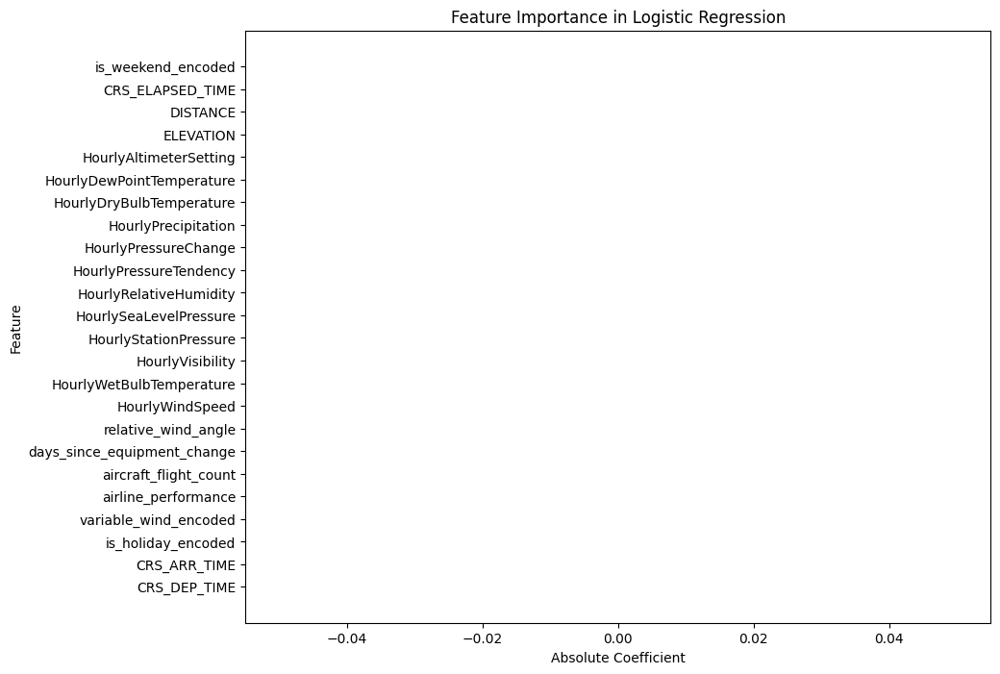

In [0]:
# Get the best model from cross-validation
best_model = cv_model_lr.bestModel

# Extract the logistic regression model
logistic_model = best_model.stages[-1]

# Get the coefficients and the feature names
coefficients = logistic_model.coefficients.toArray()
feature_names = numerical_final + [column + "_encoded" for column in decided_categorical_final]

# Create a DataFrame to display feature importance
import pandas as pd

feature_importance = pd.DataFrame(list(zip(feature_names, coefficients)), columns=["Feature", "Coefficient"])
feature_importance["Absolute Coefficient"] = feature_importance["Coefficient"].abs()
feature_importance = feature_importance.sort_values(by="Absolute Coefficient", ascending=False)

print(feature_importance)

# Plot the feature importance
import matplotlib.pyplot as plt
plt.figure(figsize=(10, 8))
plt.barh(feature_importance["Feature"], feature_importance["Absolute Coefficient"])
plt.xlabel("Absolute Coefficient")
plt.ylabel("Feature")
plt.title("Feature Importance in Logistic Regression")
plt.show()

Feature,Coefficient
CRS_DEP_TIME,0.0
CRS_ARR_TIME,0.0
is_holiday_encoded,0.0
variable_wind_encoded,0.0
airline_performance,0.0
aircraft_flight_count,0.0
days_since_equipment_change,0.0
relative_wind_angle,0.0
HourlyWindSpeed,0.0
HourlyWetBulbTemperature,0.0


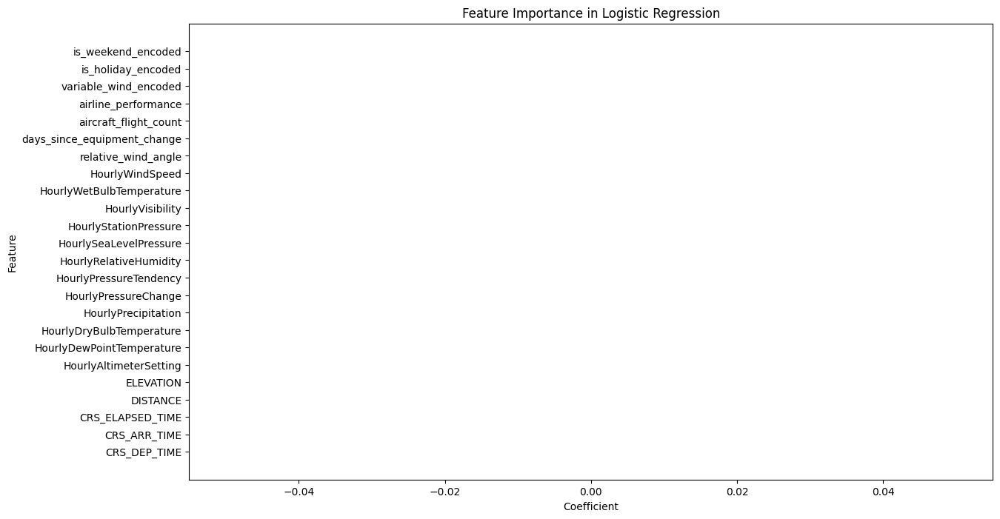

In [0]:
# Get the best model from cross-validation
best_model = cv_model_lr.bestModel

# Extract the logistic regression model
logistic_model = best_model.stages[-1]

# Get the coefficients and the feature names
coefficients = logistic_model.coefficients.toArray()
feature_names = numerical_final + [column + "_encoded" for column in decided_categorical_final]

# Create a DataFrame to display feature importance
import pandas as pd

feature_importance = pd.DataFrame(list(zip(feature_names, coefficients)), columns=["Feature", "Coefficient"])
feature_importance = feature_importance.sort_values(by="Coefficient", ascending=False)

# Display the DataFrame
display(feature_importance)

# Sort by the magnitude of the coefficient
feature_importance = feature_importance.sort_values(by='Coefficient', ascending=False)

# Plotting
plt.figure(figsize=(14, 8))
colors = ['green' if coef > 0 else 'red' for coef in feature_importance['Coefficient']]
plt.barh(feature_importance['Feature'], feature_importance['Coefficient'], color=colors)
plt.xlabel('Coefficient')
plt.ylabel('Feature')
plt.title('Feature Importance in Logistic Regression')
plt.show()

#### Predict on Test dataset

In [0]:
spark_evaluate_on_test(cv_model_lr.bestModel, test_transformed, label_col="label")

Model Accuracy: 0.1607035678087505
Model Precision: 0.025825636706461673
Model Recall: 0.1607035678087505
Model F1 Score: 0.04449996954040029


### PCA Analysis

In [0]:
from pyspark.ml.feature import PCA
from pyspark.ml.linalg import Vectors

# Number of principal components
k = 10  # Adjust this based on the variance retained

# Initialize the PCA model
pca = PCA(k=k, inputCol="scaled_features", outputCol="pca_features")

# Fit PCA on training data and transform both training and test datasets
pca_model = pca.fit(df_transformed)
df_pca_transformed = pca_model.transform(df_transformed)
test_pca_transformed = pca_model.transform(test_transformed)

# Define the logistic regression model using PCA features
lr = LogisticRegression(featuresCol="pca_features", labelCol="label")

# Step 3: Create the pipeline
pipeline = Pipeline(stages=[lr])

# Step 4: Cross-validation with the custom TimeSeriesCrossValidator
ts_cv = TimeSeriesCrossValidator(estimator=pipeline, 
                                evaluator=evaluator_f1, 
                                numFolds=3)

# Run cross-validation and fit the model on the PCA-transformed training data
cv_model = ts_cv.fit(df_pca_transformed)

# Step 5: Evaluate the model on the PCA-transformed test data
spark_evaluate_on_test(cv_model.bestModel, test_pca_transformed, label_col="label")

com.databricks.backend.common.rpc.CommandCancelledException
	at com.databricks.spark.chauffeur.ExecContextState.$anonfun$shutdown$3(ExecContextState.scala:450)
	at scala.collection.immutable.List.flatMap(List.scala:366)
	at com.databricks.spark.chauffeur.ExecContextState.shutdown(ExecContextState.scala:450)
	at com.databricks.spark.chauffeur.ChauffeurState.shutdownContext(ChauffeurState.scala:704)
	at com.databricks.spark.chauffeur.ChauffeurState.$anonfun$clearAllRunningState$4(ChauffeurState.scala:673)
	at scala.collection.immutable.List.foreach(List.scala:431)
	at com.databricks.spark.chauffeur.ChauffeurState.clearAllRunningState(ChauffeurState.scala:671)
	at com.databricks.spark.chauffeur.ChauffeurState.processDriverStateChange(ChauffeurState.scala:467)
	at com.databricks.spark.chauffeur.Chauffeur.onDriverStateChange(Chauffeur.scala:1468)
	at com.databricks.spark.chauffeur.Chauffeur.$anonfun$driverStateOpt$1(Chauffeur.scala:185)
	at com.databricks.spark.chauffeur.Chauffeur.$anonfun$

In [0]:
from pyspark.ml.feature import PCA
from pyspark.ml.linalg import Vectors

# Number of principal components
k = 10  # Adjust this based on the variance retained

# Initialize the PCA model
pca = PCA(k=k, inputCol="scaled_features", outputCol="pca_features")

# Fit PCA on training data and transform both training and test datasets
pca_model = pca.fit(df_transformed)
df_pca_transformed = pca_model.transform(df_transformed)
test_pca_transformed = pca_model.transform(test_transformed)

# Define the logistic regression model using PCA features
lr = LogisticRegression(featuresCol="pca_features", labelCol="label")

# Step 3: Create the pipeline
pipeline = Pipeline(stages=[lr])

# Step 4: Cross-validation with the custom TimeSeriesCrossValidator
ts_cv = TimeSeriesCrossValidator(estimator=pipeline, 
                                evaluator=evaluator_f1, 
                                numFolds=3)

# Run cross-validation and fit the model on the PCA-transformed training data
cv_model = ts_cv.fit(df_pca_transformed)

com.databricks.backend.common.rpc.CommandCancelledException
	at com.databricks.spark.chauffeur.ExecContextState.$anonfun$shutdown$3(ExecContextState.scala:450)
	at scala.collection.immutable.List.flatMap(List.scala:366)
	at com.databricks.spark.chauffeur.ExecContextState.shutdown(ExecContextState.scala:450)
	at com.databricks.spark.chauffeur.ChauffeurState.shutdownContext(ChauffeurState.scala:704)
	at com.databricks.spark.chauffeur.ChauffeurState.$anonfun$clearAllRunningState$4(ChauffeurState.scala:673)
	at scala.collection.immutable.List.foreach(List.scala:431)
	at com.databricks.spark.chauffeur.ChauffeurState.clearAllRunningState(ChauffeurState.scala:671)
	at com.databricks.spark.chauffeur.ChauffeurState.processDriverStateChange(ChauffeurState.scala:467)
	at com.databricks.spark.chauffeur.Chauffeur.onDriverStateChange(Chauffeur.scala:1468)
	at com.databricks.spark.chauffeur.Chauffeur.$anonfun$driverStateOpt$1(Chauffeur.scala:185)
	at com.databricks.spark.chauffeur.Chauffeur.$anonfun$

#### Evaluate on Test Data

In [0]:
# Evaluate the model on the PCA-transformed test data
spark_evaluate_on_test(cv_model.bestModel, test_pca_transformed, label_col="label")

com.databricks.backend.common.rpc.CommandCancelledException
	at com.databricks.spark.chauffeur.ExecContextState.$anonfun$shutdown$3(ExecContextState.scala:450)
	at scala.collection.immutable.List.flatMap(List.scala:366)
	at com.databricks.spark.chauffeur.ExecContextState.shutdown(ExecContextState.scala:450)
	at com.databricks.spark.chauffeur.ChauffeurState.shutdownContext(ChauffeurState.scala:704)
	at com.databricks.spark.chauffeur.ChauffeurState.$anonfun$clearAllRunningState$4(ChauffeurState.scala:673)
	at scala.collection.immutable.List.foreach(List.scala:431)
	at com.databricks.spark.chauffeur.ChauffeurState.clearAllRunningState(ChauffeurState.scala:671)
	at com.databricks.spark.chauffeur.ChauffeurState.processDriverStateChange(ChauffeurState.scala:467)
	at com.databricks.spark.chauffeur.Chauffeur.onDriverStateChange(Chauffeur.scala:1468)
	at com.databricks.spark.chauffeur.Chauffeur.$anonfun$driverStateOpt$1(Chauffeur.scala:185)
	at com.databricks.spark.chauffeur.Chauffeur.$anonfun$

### MLP Neural Network

In [0]:
from pyspark.ml.classification import MultilayerPerceptronClassifier

com.databricks.backend.common.rpc.CommandCancelledException
	at com.databricks.spark.chauffeur.ExecContextState.cancel(ExecContextState.scala:444)
	at com.databricks.spark.chauffeur.ChauffeurState.cancelExecution(ChauffeurState.scala:1268)
	at com.databricks.spark.chauffeur.ChauffeurState.$anonfun$process$1(ChauffeurState.scala:985)
	at com.databricks.logging.UsageLogging.$anonfun$recordOperation$1(UsageLogging.scala:525)
	at com.databricks.logging.UsageLogging.executeThunkAndCaptureResultTags$1(UsageLogging.scala:629)
	at com.databricks.logging.UsageLogging.$anonfun$recordOperationWithResultTags$4(UsageLogging.scala:647)
	at com.databricks.logging.AttributionContextTracing.$anonfun$withAttributionContext$1(AttributionContextTracing.scala:48)
	at com.databricks.logging.AttributionContext$.$anonfun$withValue$1(AttributionContext.scala:244)
	at scala.util.DynamicVariable.withValue(DynamicVariable.scala:62)
	at com.databricks.logging.AttributionContext$.withValue(AttributionContext.scala:

In [0]:
input_size = df_transformed.select("scaled_features").head()[0].size

# Define the layers dynamically based on the input size
# layers = [input_size, int(input_size / 2), int(input_size / 4), int(input_size / 8), 2]
layers = [input_size, int(9), int(3), 2]

mlp = MultilayerPerceptronClassifier(featuresCol="scaled_features", labelCol="label", maxIter=5, layers=layers, blockSize=128, seed=42, stepSize=0.1)

# Create a pipeline with the MLP classifier
pipeline = Pipeline(stages=[mlp])

print(input_size)
print(layers)

com.databricks.backend.common.rpc.CommandCancelledException
	at com.databricks.spark.chauffeur.ExecContextState.cancel(ExecContextState.scala:444)
	at com.databricks.spark.chauffeur.ChauffeurState.cancelExecution(ChauffeurState.scala:1268)
	at com.databricks.spark.chauffeur.ChauffeurState.$anonfun$process$1(ChauffeurState.scala:985)
	at com.databricks.logging.UsageLogging.$anonfun$recordOperation$1(UsageLogging.scala:525)
	at com.databricks.logging.UsageLogging.executeThunkAndCaptureResultTags$1(UsageLogging.scala:629)
	at com.databricks.logging.UsageLogging.$anonfun$recordOperationWithResultTags$4(UsageLogging.scala:647)
	at com.databricks.logging.AttributionContextTracing.$anonfun$withAttributionContext$1(AttributionContextTracing.scala:48)
	at com.databricks.logging.AttributionContext$.$anonfun$withValue$1(AttributionContext.scala:244)
	at scala.util.DynamicVariable.withValue(DynamicVariable.scala:62)
	at com.databricks.logging.AttributionContext$.withValue(AttributionContext.scala:

In [0]:
# CrossValidator using the custom TimeSeriesCrossValidator
ts_cv_mlp = TimeSeriesCrossValidator(estimator=pipeline, 
                                # estimatorParamMaps=paramGrid, 
                                evaluator=evaluator_f1, 
                                numFolds=3)

# Run cross-validation, and choose the best set of parameters
cv_model_mlp = ts_cv_mlp.fit(final_df)
print(f"Average Metrics: {cv_model_mlp.avg_metrics}")

com.databricks.backend.common.rpc.CommandCancelledException
	at com.databricks.spark.chauffeur.ExecContextState.cancel(ExecContextState.scala:444)
	at com.databricks.spark.chauffeur.ChauffeurState.cancelExecution(ChauffeurState.scala:1268)
	at com.databricks.spark.chauffeur.ChauffeurState.$anonfun$process$1(ChauffeurState.scala:985)
	at com.databricks.logging.UsageLogging.$anonfun$recordOperation$1(UsageLogging.scala:525)
	at com.databricks.logging.UsageLogging.executeThunkAndCaptureResultTags$1(UsageLogging.scala:629)
	at com.databricks.logging.UsageLogging.$anonfun$recordOperationWithResultTags$4(UsageLogging.scala:647)
	at com.databricks.logging.AttributionContextTracing.$anonfun$withAttributionContext$1(AttributionContextTracing.scala:48)
	at com.databricks.logging.AttributionContext$.$anonfun$withValue$1(AttributionContext.scala:244)
	at scala.util.DynamicVariable.withValue(DynamicVariable.scala:62)
	at com.databricks.logging.AttributionContext$.withValue(AttributionContext.scala:

#### Evaluate on Test Data

In [0]:
spark_evaluate_on_test(cv_model_mlp.bestModel, test_df, label_col="label")

com.databricks.backend.common.rpc.CommandCancelledException
	at com.databricks.spark.chauffeur.ExecContextState.cancel(ExecContextState.scala:444)
	at com.databricks.spark.chauffeur.ChauffeurState.cancelExecution(ChauffeurState.scala:1268)
	at com.databricks.spark.chauffeur.ChauffeurState.$anonfun$process$1(ChauffeurState.scala:985)
	at com.databricks.logging.UsageLogging.$anonfun$recordOperation$1(UsageLogging.scala:525)
	at com.databricks.logging.UsageLogging.executeThunkAndCaptureResultTags$1(UsageLogging.scala:629)
	at com.databricks.logging.UsageLogging.$anonfun$recordOperationWithResultTags$4(UsageLogging.scala:647)
	at com.databricks.logging.AttributionContextTracing.$anonfun$withAttributionContext$1(AttributionContextTracing.scala:48)
	at com.databricks.logging.AttributionContext$.$anonfun$withValue$1(AttributionContext.scala:244)
	at scala.util.DynamicVariable.withValue(DynamicVariable.scala:62)
	at com.databricks.logging.AttributionContext$.withValue(AttributionContext.scala:

### MLP Architecture 2

In [0]:
input_size = df_transformed.select("scaled_features").head()[0].size

# Define the layers dynamically based on the input size
# layers = [input_size, int(input_size / 2), int(input_size / 4), int(input_size / 8), 2]
layers = [input_size, int(18), int(18), int(18), int(9), int(9), int(9), int(5), 2]

mlp2 = MultilayerPerceptronClassifier(featuresCol="scaled_features", labelCol="label", maxIter=5, layers=layers, blockSize=128, seed=42, stepSize=0.1)
"S"
# Create a pipeline with the MLP classifier
pipeline = Pipeline(stages=[mlp2])

print(input_size)
print(layers)

com.databricks.backend.common.rpc.CommandCancelledException
	at com.databricks.spark.chauffeur.ExecContextState.cancel(ExecContextState.scala:444)
	at com.databricks.spark.chauffeur.ChauffeurState.cancelExecution(ChauffeurState.scala:1268)
	at com.databricks.spark.chauffeur.ChauffeurState.$anonfun$process$1(ChauffeurState.scala:985)
	at com.databricks.logging.UsageLogging.$anonfun$recordOperation$1(UsageLogging.scala:525)
	at com.databricks.logging.UsageLogging.executeThunkAndCaptureResultTags$1(UsageLogging.scala:629)
	at com.databricks.logging.UsageLogging.$anonfun$recordOperationWithResultTags$4(UsageLogging.scala:647)
	at com.databricks.logging.AttributionContextTracing.$anonfun$withAttributionContext$1(AttributionContextTracing.scala:48)
	at com.databricks.logging.AttributionContext$.$anonfun$withValue$1(AttributionContext.scala:244)
	at scala.util.DynamicVariable.withValue(DynamicVariable.scala:62)
	at com.databricks.logging.AttributionContext$.withValue(AttributionContext.scala:

In [0]:
# CrossValidator using the custom TimeSeriesCrossValidator
ts_cv_mlp2 = TimeSeriesCrossValidator(estimator=pipeline, 
                                # estimatorParamMaps=paramGrid, 
                                evaluator=evaluator_f1, 
                                numFolds=3)

# Run cross-validation, and choose the best set of parameters
cv_model_mlp2 = ts_cv_mlp2.fit(final_df)
print(f"Average Metrics: {cv_model_mlp.avg_metrics}")

com.databricks.backend.common.rpc.CommandCancelledException
	at com.databricks.spark.chauffeur.ExecContextState.cancel(ExecContextState.scala:444)
	at com.databricks.spark.chauffeur.ChauffeurState.cancelExecution(ChauffeurState.scala:1268)
	at com.databricks.spark.chauffeur.ChauffeurState.$anonfun$process$1(ChauffeurState.scala:985)
	at com.databricks.logging.UsageLogging.$anonfun$recordOperation$1(UsageLogging.scala:525)
	at com.databricks.logging.UsageLogging.executeThunkAndCaptureResultTags$1(UsageLogging.scala:629)
	at com.databricks.logging.UsageLogging.$anonfun$recordOperationWithResultTags$4(UsageLogging.scala:647)
	at com.databricks.logging.AttributionContextTracing.$anonfun$withAttributionContext$1(AttributionContextTracing.scala:48)
	at com.databricks.logging.AttributionContext$.$anonfun$withValue$1(AttributionContext.scala:244)
	at scala.util.DynamicVariable.withValue(DynamicVariable.scala:62)
	at com.databricks.logging.AttributionContext$.withValue(AttributionContext.scala:

#### Evaluate on Test Data

In [0]:
spark_evaluate_on_test(cv_model_mlp2.bestModel, test_df, label_col="label")

com.databricks.backend.common.rpc.CommandCancelledException
	at com.databricks.spark.chauffeur.ExecContextState.cancel(ExecContextState.scala:444)
	at com.databricks.spark.chauffeur.ChauffeurState.cancelExecution(ChauffeurState.scala:1268)
	at com.databricks.spark.chauffeur.ChauffeurState.$anonfun$process$1(ChauffeurState.scala:985)
	at com.databricks.logging.UsageLogging.$anonfun$recordOperation$1(UsageLogging.scala:525)
	at com.databricks.logging.UsageLogging.executeThunkAndCaptureResultTags$1(UsageLogging.scala:629)
	at com.databricks.logging.UsageLogging.$anonfun$recordOperationWithResultTags$4(UsageLogging.scala:647)
	at com.databricks.logging.AttributionContextTracing.$anonfun$withAttributionContext$1(AttributionContextTracing.scala:48)
	at com.databricks.logging.AttributionContext$.$anonfun$withValue$1(AttributionContext.scala:244)
	at scala.util.DynamicVariable.withValue(DynamicVariable.scala:62)
	at com.databricks.logging.AttributionContext$.withValue(AttributionContext.scala: